
# Estadística de pozos

Analisis estadistico de historico de pozos

In [54]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import os
import scipy
import scipy.stats
from scipy.optimize import curve_fit
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
%matplotlib inline

import timeit

In [2]:
pd.set_option('display.max_rows', 100_000_000)
pd.set_option('display.max_columns', 100_000_000)
pd.set_option('display.width', 1_000)
pd.set_option('precision', 2)
pd.options.display.float_format = '{:,.2f}'.format

In [3]:
import timeit
tic=timeit.default_timer()
toc=timeit.default_timer()
toc - tic #elapsed time in seconds

4.778400000038374e-05

<div class="alert alert-block alert-danger">

### <b>Check Harmonic Equation</b>
<br>
· b should be = 1, check bounds argument in harmonic_equation
<br>
· automate unique_well_list generation
<br>

</div>

In [4]:
def input_pozos(x): 
        
        global pozos
        pozos = pd.DataFrame(columns=["Campo",
                                      "Coordenadas",
                                      "Qo aceite",
                                      "Qo gas"])

        #parts=int(input("Numero de campos: "))
        parts = x

        # !!!!!! Verificar resultado de la funcion format... cambiar a integer
        
        for i in range(parts):
            campo = input("Nombre de Campo: ")
            coordenadas = input("Coordenadas: ".format(campo))
            Qo_aceite = input("Qo aceite: ".format(campo))
            Qo_gas = input("Qo gas: ".format(campo))
            df1 = pd.DataFrame(data=[[campo,coordenadas,Qo_aceite,Qo_gas]],columns=["Campo",
                                                                                    "Coordenadas",
                                                                                    "Qo aceite",
                                                                                    "Qo gas"])
            pozos = pd.concat([pozos,df1], axis=0)

        pozos.index = range(len(pozos.index))

## Estadistica - Kumaza

,Unnamed: 0,fecha,campo,yacimiento,plataforma,pozo,inicio_produccion_aceite,ultima_produccion_aceite,gasto_aceite_Mbd,gasto_agua_Mbd,gasto_gas_MMpcd,gasto_gas_BN_MMpcd,RGA_m3/m3,aceite_acumulado_MMb,agua_acumulada_MMb,gas_acumulado_MMMpc,cima_intervalo_mvbnm,base_intervalo_mvbnm,distancia_superior_intervalo_a_contacto_gas-aceite_(m),fluyente_BEC_o _BN,RGA_pc/bl,nivel_CGA,cima_mv -nivel_CGA,estatus,arriba_abajo_CGA,campo_yacimiento,first_oil,Dias Produciendo,days_online,Exponential_Predicted,Hyperbolic_Predicted,Harmonic_Predicted
0,0,2016-01-31,KU,KU_CCE,KU-A,KU-10,02/28/86,31/01/16,1.22,0.01,2.30,1.79,nan,9.93,0.13,5.87,"2,585.00","2,603.00",-,BN,"1,889.96",2919.2,-334.2,OPERANDO,ARRIBA,Ku-Crétacico,2016-01-31,0,0,1.22,0.60,0.61
1,178,2016-02-29,KU,KU_CCE,KU-A,KU-10,02/28/86,29/02/16,0.15,0.01,0.28,0.40,331.05,9.93,0.13,5.87,"2,585.00","2,603.00",-,BN,"1,858.69",2924.518217,-339.518217,OPERANDO,ARRIBA,Ku-Crétacico,2016-01-31,29,29,0.00,0.60,0.60
2,357,2016-03-31,KU,KU_CCE,KU-A,KU-10,02/28/86,31/03/16,0.44,0.10,0.90,2.05,367.06,9.94,0.14,5.90,"2,585.00","2,603.00",-,BN,"2,060.87",2918.6,-333.6,OPERANDO,ARRIBA,Ku-Crétacico,2016-01-31,60,60,0.00,0.59,0.59
3,538,2016-04-30,KU,KU_CCE,KU-A,KU-10,02/28/86,30/04/16,0.44,0.03,0.97,1.81,389.10,9.96,0.14,5.93,"2,585.00","2,603.00",-,BN,"2,184.62",2918.6,-333.6,OPERANDO,ARRIBA,Ku-Crétacico,2016-01-31,90,90,0.00,0.59,0.59
4,719,2016-05-31,KU,KU_CCE,KU-A,KU-10,02/28/86,31/05/16,0.45,0.07,0.98,2.61,388.96,9.97,0.14,5.96,"2,585.00","2,603.00",-,BN,"2,183.85",2923.5,-338.5,OPERANDO,ARRIBA,Ku-Crétacico,2016-01-31,121,121,0.00,0.58,0.58


Index(['Unnamed: 0', 'fecha', 'campo', 'yacimiento', 'plataforma', 'pozo', 'inicio_produccion_aceite', 'ultima_produccion_aceite', 'gasto_aceite_Mbd', 'gasto_agua_Mbd', 'gasto_gas_MMpcd', 'gasto_gas_BN_MMpcd', 'RGA_m3/m3', 'aceite_acumulado_MMb', 'agua_acumulada_MMb', 'gas_acumulado_MMMpc', 'cima_intervalo_mvbnm', 'base_intervalo_mvbnm', 'distancia_superior_intervalo_a_contacto_gas-aceite_(m)', 'fluyente_BEC_o _BN', 'RGA_pc/bl', 'nivel_CGA', 'cima_mv -nivel_CGA', 'estatus', 'arriba_abajo_CGA', 'campo_yacimiento', 'first_oil', 'Dias Produciendo', 'days_online', 'Exponential_Predicted', 'Hyperbolic_Predicted', 'Harmonic_Predicted'], dtype='object')

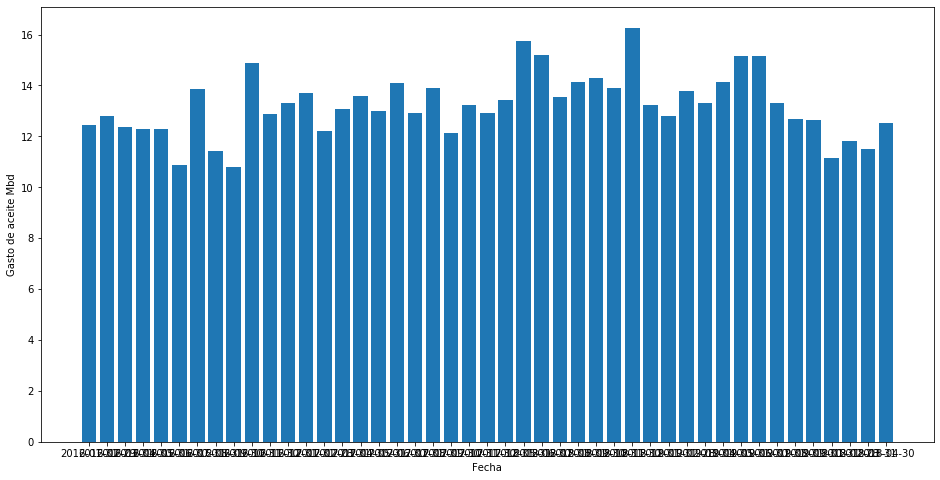

In [5]:
df=pd.read_csv(r'/Users/fffte/ainda_drive/python/csv/benchmark/kumaza_dca.csv',
               parse_dates=True)
display(df.head(),df.columns)

fig, ax = plt.subplots(figsize=(16,8))
ax.bar(df.fecha,df.gasto_aceite_Mbd)
ax.set_xlabel('Fecha')
ax.set_ylabel('Gasto de aceite Mbd')
plt.show()
#df.gasto_gas_MMpcd.plot(figsize=(20,10),cmap='viridis')

## Dispersion Analysis

CPU times: user 2 µs, sys: 1e+03 ns, total: 3 µs
Wall time: 4.77 µs


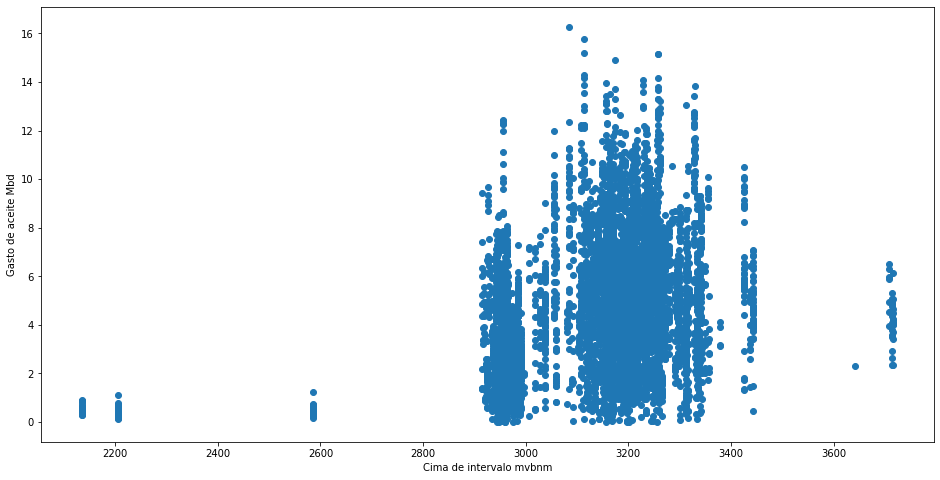

In [6]:
%time 

fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(df['cima_intervalo_mvbnm'],df['gasto_aceite_Mbd'])
ax.set_xlabel('Cima de intervalo mvbnm')
ax.set_ylabel('Gasto de aceite Mbd')
plt.show()

CPU times: user 2 µs, sys: 1e+03 ns, total: 3 µs
Wall time: 5.96 µs


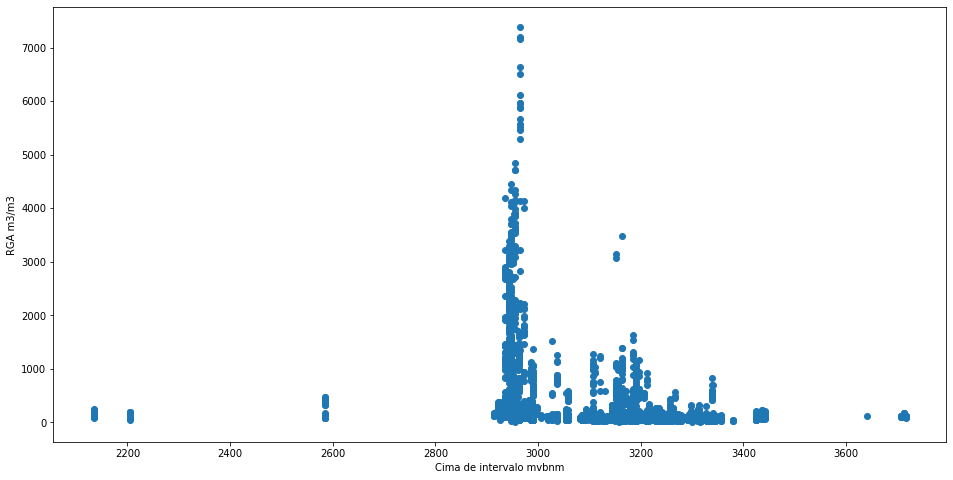

In [7]:
%time 

fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(df['cima_intervalo_mvbnm'],df['RGA_m3/m3'] )
ax.set_xlabel('Cima de intervalo mvbnm')
ax.set_ylabel('RGA m3/m3')
plt.show()

In [8]:
df.columns

Index(['Unnamed: 0', 'fecha', 'campo', 'yacimiento', 'plataforma', 'pozo', 'inicio_produccion_aceite', 'ultima_produccion_aceite', 'gasto_aceite_Mbd', 'gasto_agua_Mbd', 'gasto_gas_MMpcd', 'gasto_gas_BN_MMpcd', 'RGA_m3/m3', 'aceite_acumulado_MMb', 'agua_acumulada_MMb', 'gas_acumulado_MMMpc', 'cima_intervalo_mvbnm', 'base_intervalo_mvbnm', 'distancia_superior_intervalo_a_contacto_gas-aceite_(m)', 'fluyente_BEC_o _BN', 'RGA_pc/bl', 'nivel_CGA', 'cima_mv -nivel_CGA', 'estatus', 'arriba_abajo_CGA', 'campo_yacimiento', 'first_oil', 'Dias Produciendo', 'days_online', 'Exponential_Predicted', 'Hyperbolic_Predicted', 'Harmonic_Predicted'], dtype='object')

In [9]:
to_plot=pd.DataFrame(df,columns=['fecha', 
                                 'campo',
                                 'pozo', 
                                 'gasto_aceite_Mbd',
                                 'gasto_agua_Mbd',
                                 'gasto_gas_MMpcd',
                                 'gasto_gas_BN_MMpcd',
                                 'RGA_m3/m3',
                                 'aceite_acumulado_MMb', 
                                 'agua_acumulada_MMb',
                                 'gas_acumulado_MMMpc',
                                 'cima_intervalo_mvbnm',
                                 'base_intervalo_mvbnm',
                                 'days_online', 
                                 'Exponential_Predicted', 
                                 'Hyperbolic_Predicted', 
                                 'Harmonic_Predicted'])

In [10]:
to_plot2=pd.DataFrame(df,columns=['fecha', 
                                 'campo',
                                 'pozo', 
                                 'gasto_aceite_Mbd',
                                 'gasto_agua_Mbd',
                                 'gasto_gas_MMpcd',
                                 'gasto_gas_BN_MMpcd',
                                 'days_online',
                                 'RGA_m3/m3',])

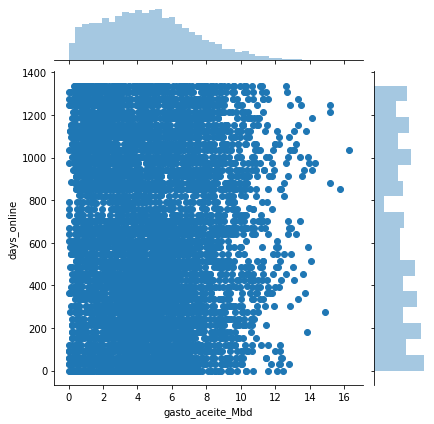

In [11]:
sns.jointplot(to_plot2.gasto_aceite_Mbd,to_plot2.days_online)

/opt/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:829: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/opt/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:830: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


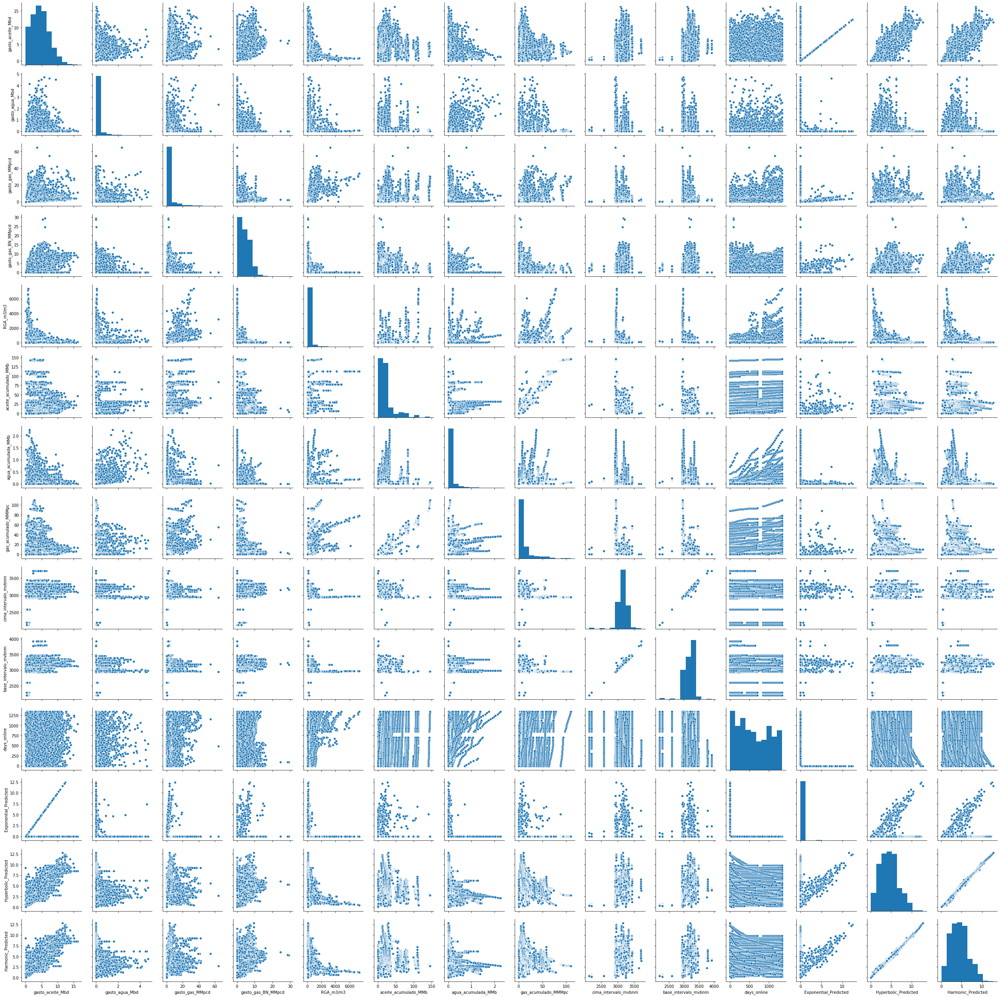

In [12]:
sns.pairplot(to_plot)

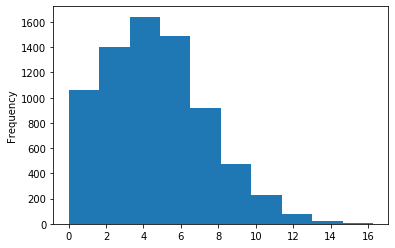

In [13]:
df.gasto_aceite_Mbd.plot.hist()

In [14]:
display(df.head(),df.shape)
unique_well_list=pd.unique(list(df.pozo))
display(unique_well_list.shape, len(unique_well_list))

,Unnamed: 0,fecha,campo,yacimiento,plataforma,pozo,inicio_produccion_aceite,ultima_produccion_aceite,gasto_aceite_Mbd,gasto_agua_Mbd,gasto_gas_MMpcd,gasto_gas_BN_MMpcd,RGA_m3/m3,aceite_acumulado_MMb,agua_acumulada_MMb,gas_acumulado_MMMpc,cima_intervalo_mvbnm,base_intervalo_mvbnm,distancia_superior_intervalo_a_contacto_gas-aceite_(m),fluyente_BEC_o _BN,RGA_pc/bl,nivel_CGA,cima_mv -nivel_CGA,estatus,arriba_abajo_CGA,campo_yacimiento,first_oil,Dias Produciendo,days_online,Exponential_Predicted,Hyperbolic_Predicted,Harmonic_Predicted
0,0,2016-01-31,KU,KU_CCE,KU-A,KU-10,02/28/86,31/01/16,1.22,0.01,2.30,1.79,nan,9.93,0.13,5.87,"2,585.00","2,603.00",-,BN,"1,889.96",2919.2,-334.2,OPERANDO,ARRIBA,Ku-Crétacico,2016-01-31,0,0,1.22,0.60,0.61
1,178,2016-02-29,KU,KU_CCE,KU-A,KU-10,02/28/86,29/02/16,0.15,0.01,0.28,0.40,331.05,9.93,0.13,5.87,"2,585.00","2,603.00",-,BN,"1,858.69",2924.518217,-339.518217,OPERANDO,ARRIBA,Ku-Crétacico,2016-01-31,29,29,0.00,0.60,0.60
2,357,2016-03-31,KU,KU_CCE,KU-A,KU-10,02/28/86,31/03/16,0.44,0.10,0.90,2.05,367.06,9.94,0.14,5.90,"2,585.00","2,603.00",-,BN,"2,060.87",2918.6,-333.6,OPERANDO,ARRIBA,Ku-Crétacico,2016-01-31,60,60,0.00,0.59,0.59
3,538,2016-04-30,KU,KU_CCE,KU-A,KU-10,02/28/86,30/04/16,0.44,0.03,0.97,1.81,389.10,9.96,0.14,5.93,"2,585.00","2,603.00",-,BN,"2,184.62",2918.6,-333.6,OPERANDO,ARRIBA,Ku-Crétacico,2016-01-31,90,90,0.00,0.59,0.59
4,719,2016-05-31,KU,KU_CCE,KU-A,KU-10,02/28/86,31/05/16,0.45,0.07,0.98,2.61,388.96,9.97,0.14,5.96,"2,585.00","2,603.00",-,BN,"2,183.85",2923.5,-338.5,OPERANDO,ARRIBA,Ku-Crétacico,2016-01-31,121,121,0.00,0.58,0.58


(7328, 32)

(222,)

222

count   7,328.00
mean        4.66
std         2.72
min         0.00
25%         2.57
50%         4.46
75%         6.37
max        16.27
Name: gasto_aceite_Mbd, dtype: float64

0.10   1.20
0.50   4.46
0.90   8.36
Name: gasto_aceite_Mbd, dtype: float64

count   7,328.00
mean        4.45
std         2.23
min         0.03
25%         2.77
50%         4.30
75%         5.74
max        12.80
Name: Hyperbolic_Predicted, dtype: float64

0.10   1.70
0.50   4.30
0.90   7.53
Name: Hyperbolic_Predicted, dtype: float64

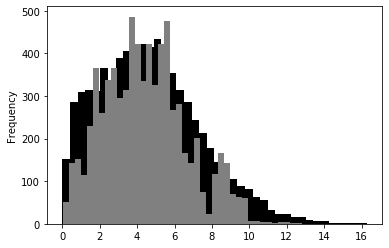

In [15]:
display(df.gasto_aceite_Mbd.describe(),
        df.gasto_aceite_Mbd.quantile([.1,.5,.9]),
        df.Hyperbolic_Predicted.describe(),
        df.Hyperbolic_Predicted.quantile([.1,.5,.9]))
df.gasto_aceite_Mbd.plot.hist(bins=40,color='black'),
df.Hyperbolic_Predicted.plot.hist(bins=40,color='gray')

count   7,328.00
mean        3.66
std         5.25
min         0.00
25%         1.24
50%         2.12
75%         3.52
max        64.57
Name: gasto_gas_MMpcd, dtype: float64

0.10   0.65
0.50   2.12
0.90   7.48
Name: gasto_gas_MMpcd, dtype: float64

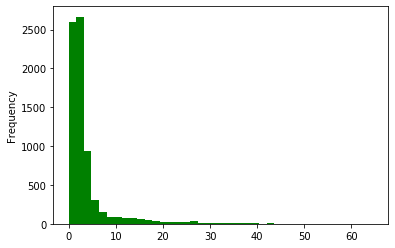

In [16]:
display(df.gasto_gas_MMpcd.describe(),
       df.gasto_gas_MMpcd.quantile([.1,.5,.9]))
df.gasto_gas_MMpcd.plot.hist(bins=40,color='green')

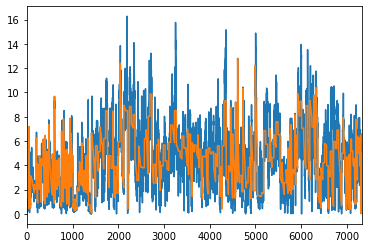

In [17]:
df.gasto_aceite_Mbd.plot()
df.Hyperbolic_Predicted.plot()

In [18]:
class Distribution(object):
    
    def __init__(self,dist_names_list = []):
        self.dist_names = ['beta',
                            'expon',
                            'gamma',
                            'lognorm',
                            'norm',
                            'pearson3',
                            'triang',
                            'uniform',
                            'weibull_min', 
                            'weibull_max']
        self.dist_results = []
        self.params = {}
        
        self.DistributionName = ""
        self.PValue = 0
        self.Param = None
        
        self.isFitted = False
        
        
    def Fit(self, y):
        self.dist_results = []
        self.params = {}
        for dist_name in self.dist_names:
            dist = getattr(scipy.stats, dist_name)
            param = dist.fit(y)
            
            self.params[dist_name] = param
            #Applying the Kolmogorov-Smirnov test
            D, p = scipy.stats.kstest(y, dist_name, args=param);
            self.dist_results.append((dist_name,p))
        #select the best fitted distribution
        sel_dist,p = (max(self.dist_results,key=lambda item:item[1]))
        #store the name of the best fit and its p value
        self.DistributionName = sel_dist
        self.PValue = p
        
        self.isFitted = True
        return self.DistributionName,self.PValue
    
    def Random(self, n = 1):
        if self.isFitted:
            dist_name = self.DistributionName
            param = self.params[dist_name]
            #initiate the scipy distribution
            dist = getattr(scipy.stats, dist_name)
            return dist.rvs(*param[:-2], loc=param[-2], scale=param[-1], size=n)
        else:
            raise ValueError('Must first run the Fit method.')
            
    def Plot(self,y):
        x = self.Random(n=len(y))
        fig, ax = plt.subplots(figsize=(16,8))
        plt.hist(x, alpha=0.5, label='Fitted',bins=50)
        plt.hist(y, alpha=0.5, label='Actual',bins=50)
        plt.legend(loc='upper right')

# Estadística CAMPOS

In [19]:
import timeit
tic=timeit.default_timer()

mx_stats=pd.read_csv(r'/Users/fffte/ainda_drive/python/csv/benchmark/mexico/pozos/mx_benchmark.csv',
                    low_memory=False)

display(mx_stats.shape)

toc=timeit.default_timer()
toc - tic #elapsed time in seconds

(2838332, 10)

4.169930335000004

In [20]:
input_campo = input("Nombre de Campo: ")

Nombre de Campo: COAPECHACA


In [21]:
import timeit
tic=timeit.default_timer()

selected_rows=mx_stats.pozo.str.contains(str(input_campo))
campo=mx_stats.loc[selected_rows]

unique_well_list=pd.unique(campo['pozo'])

display('Número de pozos en:',
        input_campo,
        len(unique_well_list),
        unique_well_list,
        campo.shape)


toc=timeit.default_timer()
toc - tic #elapsed time in seconds

'Número de pozos en:'

'COAPECHACA'

474

array(['COAPECHACA-1', 'COAPECHACA-10', 'COAPECHACA-100',
       'COAPECHACA-102', 'COAPECHACA-1027A', 'COAPECHACA-103',
       'COAPECHACA-104', 'COAPECHACA-1045', 'COAPECHACA-105',
       'COAPECHACA-1065', 'COAPECHACA-1086', 'COAPECHACA-11',
       'COAPECHACA-110', 'COAPECHACA-1120', 'COAPECHACA-113',
       'COAPECHACA-115', 'COAPECHACA-116', 'COAPECHACA-117',
       'COAPECHACA-12', 'COAPECHACA-121', 'COAPECHACA-126',
       'COAPECHACA-127', 'COAPECHACA-13', 'COAPECHACA-131',
       'COAPECHACA-1310', 'COAPECHACA-1320', 'COAPECHACA-135',
       'COAPECHACA-1361', 'COAPECHACA-1375', 'COAPECHACA-138',
       'COAPECHACA-14', 'COAPECHACA-146', 'COAPECHACA-148',
       'COAPECHACA-15', 'COAPECHACA-151', 'COAPECHACA-153',
       'COAPECHACA-1540', 'COAPECHACA-156', 'COAPECHACA-158',
       'COAPECHACA-16', 'COAPECHACA-17', 'COAPECHACA-171',
       'COAPECHACA-174', 'COAPECHACA-1750', 'COAPECHACA-177',
       'COAPECHACA-1770', 'COAPECHACA-178', 'COAPECHACA-18',
       'COAPECHACA-182

(40506, 10)

1.55848079499998

In [22]:
import timeit
tic=timeit.default_timer()

display(campo.aceite_Mbd.quantile([.1,.5,.9]))
display(campo.describe())

toc=timeit.default_timer()
toc - tic #elapsed time in seconds

0.10   0.01
0.50   0.02
0.90   0.06
Name: aceite_Mbd, dtype: float64

,Unnamed: 0,aceite_Mbd,agua_Mbd,condensado_Mbd,gas_asociado_MMpcd,gas_no_asociado_MMpcd
count,"40,506.00","40,506.00","40,506.00","40,506.00","40,506.00","40,506.00"
mean,"557,495.30",0.03,0.01,0.00,0.06,0.00
std,"353,505.56",0.05,0.02,0.00,0.09,0.00
min,"1,520.00",0.00,0.00,0.00,0.00,0.00
25%,"151,933.25",0.01,0.00,0.00,0.01,0.00
50%,"731,964.50",0.02,0.00,0.00,0.03,0.00
75%,"851,218.75",0.03,0.01,0.00,0.07,0.00
max,"997,732.00",0.70,0.98,0.00,3.14,0.00


0.09541584699999817

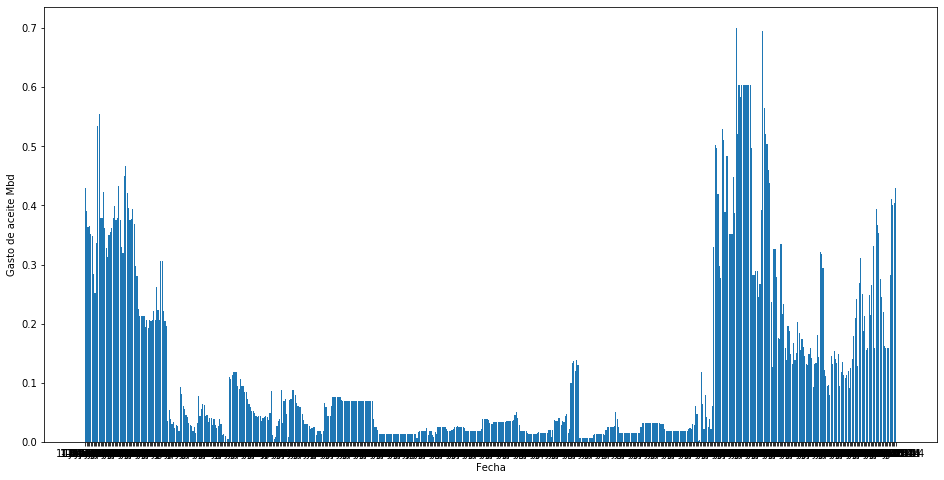

876.771232313

In [23]:
import timeit
tic=timeit.default_timer()

fig, ax = plt.subplots(figsize=(16,8))
ax.bar(campo.fecha,campo.aceite_Mbd)
ax.set_xlabel('Fecha')
ax.set_ylabel('Gasto de aceite Mbd')
plt.show()

toc=timeit.default_timer()
toc - tic #elapsed time in seconds

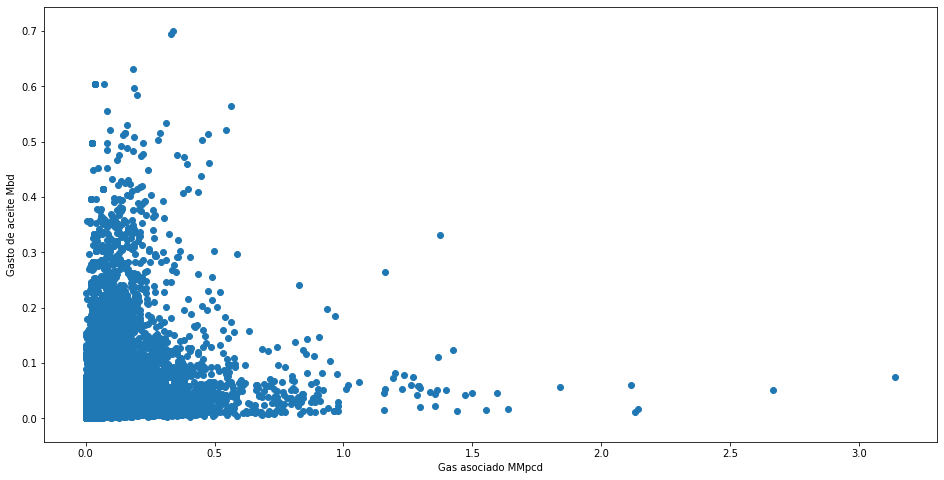

0.4556705850000071

In [24]:
import timeit
tic=timeit.default_timer()

fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(campo.gas_asociado_MMpcd,campo.aceite_Mbd)
ax.set_xlabel('Gas asociado MMpcd')
ax.set_ylabel('Gasto de aceite Mbd')
plt.show()


toc=timeit.default_timer()
toc - tic #elapsed time in seconds

0.0430111499999839

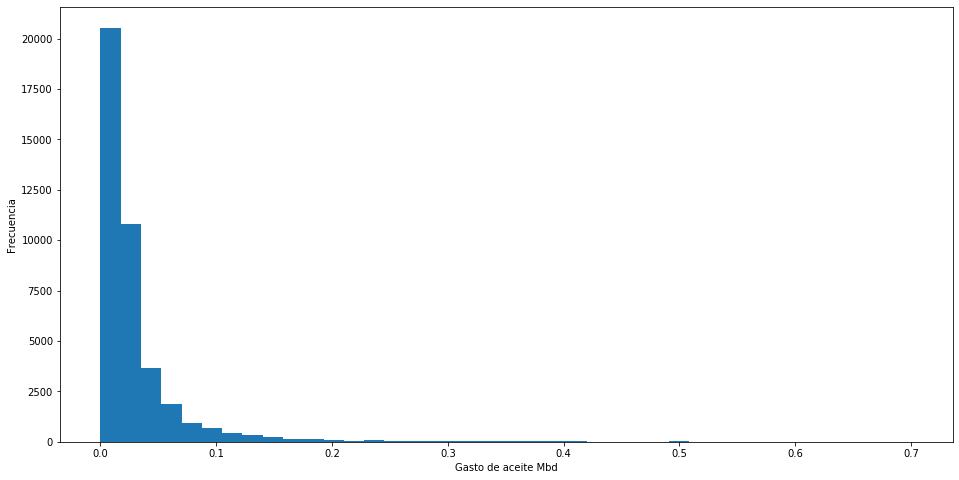

In [25]:
import timeit
tic=timeit.default_timer()

fig, ax = plt.subplots(figsize=(16,8))
ax.hist(campo.aceite_Mbd,
        bins=40,
        cumulative=False,
        density=False)
ax.set_xlabel('Gasto de aceite Mbd')
ax.set_ylabel('Frecuencia')

toc=timeit.default_timer()
toc - tic #elapsed time in seconds

/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:515: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/optimize/minpack.py:162: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


('lognorm', 1.5799549866626217e-70)

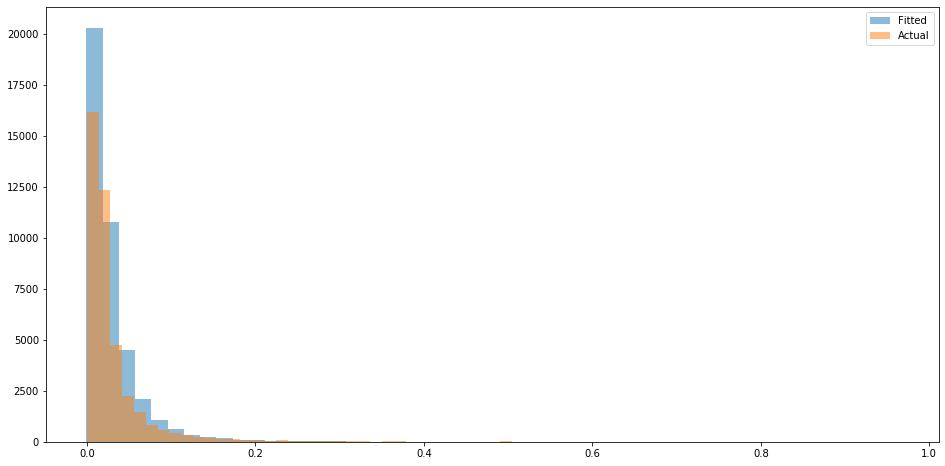

In [26]:
dst=Distribution()
display(dst.Fit(campo.aceite_Mbd))
dst.Plot(campo.aceite_Mbd)

## Q inicial

In [27]:
def get_max_initial_production(df, variable_column, well_column, date_column):
    global df_beginning_production
    global field
    """
    This function allows you to look at the first X months of production, and selects 
    the highest production month as max initial production
    Arguments:
        df: Pandas dataframe. 
        number_first_months: float. Number of months from the point the well comes online
        to compare to get the max initial production rate qi (this looks at multiple months
        in case there is a production ramp-up)
        variable_column: String. Column name for the column where we're attempting to get
        the max volume from (can be either 'Gas' or 'Oil' in this script)
        date_column: String. Column name for the date that the data was taken at 
    """
    #First, sort the data frame from earliest to most recent prod date
    field=campo.sort_values(by=[date_column,well_column])
    num_months=int((len(field))*.20)
    #Pull out the first x months of production, where number_first_months is x
    df_beginning_production=field.head(num_months)
    #Return the max value in the selected variable column from the newly created 
    #df_beginning_production df
    return df_beginning_production[variable_column].max(), num_months, field.shape

In [28]:
get_max_initial_production(campo,'aceite_Mbd','pozo','fecha')

(0.6946979999999999, 8101, (40506, 10))

In [29]:
df_beginning_production.shape

(8101, 10)

In [30]:
for unique_well_list in field:
    display(get_max_initial_production)

<function __main__.get_max_initial_production(df, variable_column, well_column, date_column)>

<function __main__.get_max_initial_production(df, variable_column, well_column, date_column)>

<function __main__.get_max_initial_production(df, variable_column, well_column, date_column)>

<function __main__.get_max_initial_production(df, variable_column, well_column, date_column)>

<function __main__.get_max_initial_production(df, variable_column, well_column, date_column)>

<function __main__.get_max_initial_production(df, variable_column, well_column, date_column)>

<function __main__.get_max_initial_production(df, variable_column, well_column, date_column)>

<function __main__.get_max_initial_production(df, variable_column, well_column, date_column)>

<function __main__.get_max_initial_production(df, variable_column, well_column, date_column)>

<function __main__.get_max_initial_production(df, variable_column, well_column, date_column)>

# Función Estadística Campos

In [60]:
def estadistica_campo():
    global campo
    global unique_well_list
    
    tic=timeit.default_timer()
    
    mx_stats=pd.read_csv(r'/Users/fffte/ainda_drive/python/csv/benchmark/mexico/pozos/mx_benchmark.csv',
                        low_memory=False)

    display(mx_stats.shape)
    
    input_campo = input("Nombre de Campo: ")
    
    selected_rows=mx_stats.pozo.str.contains(str(input_campo))
    campo=mx_stats.loc[selected_rows]

    display(campo.head(),campo.shape)
    
    unique_well_list=pd.unique(campo['pozo'])

    display('Número de pozos en:',
            input_campo,
            len(unique_well_list),
            unique_well_list,
            campo.shape)

    campo.describe()
    display(campo.aceite_Mbd.quantile([.1,.5,.9]))

    fig1, ax1 = plt.subplots(figsize=(16,8))
    mx_stats
    ax1.bar(campo.fecha,campo.aceite_Mbd)
    ax1.set_xlabel('Fecha')
    ax1.set_ylabel('Gasto de aceite Mbd')
    plt.show()

    fig2, ax2 = plt.subplots(figsize=(16,8))
    ax2.scatter(campo.fecha,campo.aceite_Mbd)
    ax2.set_xlabel('Fecha')
    ax2.set_ylabel('Gasto de aceite Mbd')
    plt.show()

    fig3, ax3 = plt.subplots(figsize=(16,8))
    ax3.hist(campo.aceite_Mbd,
            bins=40,
            cumulative=False,
            density=False)
    ax3.set_xlabel('Gasto de aceite Mbd')
    ax3.set_ylabel('Frecuencia')
    

    dst=Distribution()
    display(dst.Fit(campo.aceite_Mbd))
    dst.Plot(campo.aceite_Mbd)
    
    toc=timeit.default_timer()
    toc - tic #elapsed time in seconds
    
    return toc - tic

In [61]:
estadistica_campo()

(2838332, 10)

Nombre de Campo: ZAAP


,Unnamed: 0,aceite_Mbd,agua_Mbd,asignacion,condensado_Mbd,cuenca,fecha,gas_asociado_MMpcd,gas_no_asociado_MMpcd,pozo
1149107,247631,0.52,0.00,NaN,0.00,Cuencas del Sureste,1-Nov-1992,0.23,0.00,ZAAP-2051
1150096,248620,1.37,0.00,NaN,0.00,Cuencas del Sureste,1-Dec-1992,0.62,0.00,ZAAP-2051
1152111,250635,2.73,0.00,NaN,0.00,Cuencas del Sureste,1-Feb-1993,1.23,0.00,ZAAP-2032
1152112,250636,0.08,0.00,NaN,0.00,Cuencas del Sureste,1-Feb-1993,0.04,0.00,ZAAP-2051
1153122,251646,2.76,0.00,NaN,0.00,Cuencas del Sureste,1-Mar-1993,1.24,0.00,ZAAP-2032


(8660, 10)

'Número de pozos en:'

'ZAAP'

81

array(['ZAAP-2051', 'ZAAP-2032', 'ZAAP-3D', 'ZAAP-5D', 'ZAAP-1001',
       'ZAAP-106', 'ZAAP-7DA', 'ZAAP-27D', 'ZAAP-22D', 'ZAAP-95',
       'ZAAP-108', 'ZAAP-23D', 'ZAAP-2031', 'ZAAP-20', 'ZAAP-36',
       'ZAAP-25D', 'ZAAP-18', 'ZAAP-24', 'ZAAP-38', 'ZAAP-4', 'ZAAP-48',
       'ZAAP-10', 'ZAAP-12', 'ZAAP-26', 'ZAAP-16', 'ZAAP-32', 'ZAAP-128',
       'ZAAP-22', 'ZAAP-25', 'ZAAP-27', 'ZAAP-8', 'ZAAP-2', 'ZAAP-58',
       'ZAAP-14', 'ZAAP-28', 'ZAAP-30', 'ZAAP-41', 'ZAAP-9', 'ZAAP-6D',
       'ZAAP-43', 'ZAAP-118', 'ZAAP-6', 'ZAAP-44', 'ZAAP-1003', 'ZAAP-11',
       'ZAAP-5', 'ZAAP-210', 'ZAAP-111', 'ZAAP-208', 'ZAAP-21',
       'ZAAP-110D', 'ZAAP-29D', 'ZAAP-114D', 'ZAAP-103', 'ZAAP-31D',
       'ZAAP-15', 'ZAAP-33D', 'ZAAP-116D', 'ZAAP-50', 'ZAAP-34',
       'ZAAP-35', 'ZAAP-126', 'ZAAP-19', 'ZAAP-46D', 'ZAAP-51', 'ZAAP-90',
       'ZAAP-52', 'ZAAP-54', 'ZAAP-68', 'ZAAP-42', 'ZAAP-62', 'ZAAP-78',
       'ZAAP-72DES', 'ZAAP-56DES', 'ZAAP-66DES', 'ZAAP-53DES',
       'ZAAP-115DES', 'ZAA

(8660, 10)

0.10   1.78
0.50   5.21
0.90   9.03
Name: aceite_Mbd, dtype: float64

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3326, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-61-d7280b38f354>", line 1, in <module>
    estadistica_campo()
  File "<ipython-input-60-c14a48b9cd40>", line 35, in estadistica_campo
    plt.show()
  File "/opt/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py", line 269, in show
    return _show(*args, **kw)
  File "/opt/anaconda3/lib/python3.7/site-packages/ipykernel/pylab/backend_inline.py", line 39, in show
    metadata=_fetch_figure_metadata(figure_manager.canvas.figure)
  File "/opt/anaconda3/lib/python3.7/site-packages/IPython/core/display.py", line 306, in display
    format_dict, md_dict = format(obj, include=include, exclude=exclude)
  File "/opt/anaconda3/lib/python3.7/site-packages/IPython/core/formatters.py", line 180, in format
    data = formatter(obj)
  File "</opt/anaconda3/lib/python3.7/si

KeyboardInterrupt: 

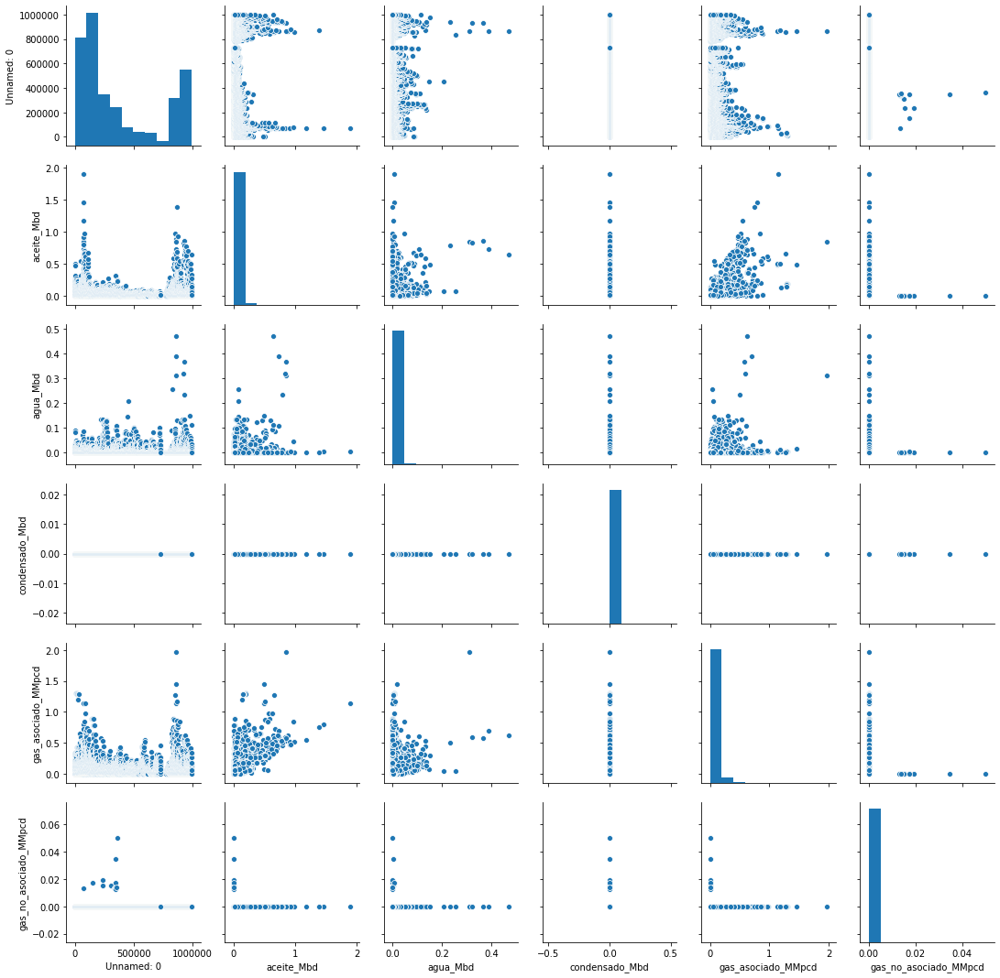

In [33]:
sns.pairplot(campo)

In [50]:
campo.to_csv(r'/Users/fffte/ainda_drive/python/csv/benchmark/'+str(input_campo))

# DCA

Exponential Fit Curve-fitted Variables: qi=0.00485300593918226, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.016083729434960104, b=1.9999999999998213, di=8.319421024693166e-06
Harmonic Fit Curve-fitted Variables: qi=0.016065170448503686, b=0.016065170448503686, di=7.8108074336043e-06


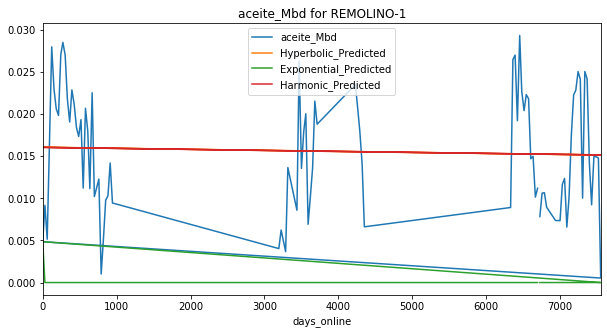

Exponential Fit Curve-fitted Variables: qi=0.09998401710598882, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.521601215415177, b=0.1780387988310563, di=0.0038347191813588514
Harmonic Fit Curve-fitted Variables: qi=0.529948352172959, b=0.529948352172959, di=0.007476222306201569


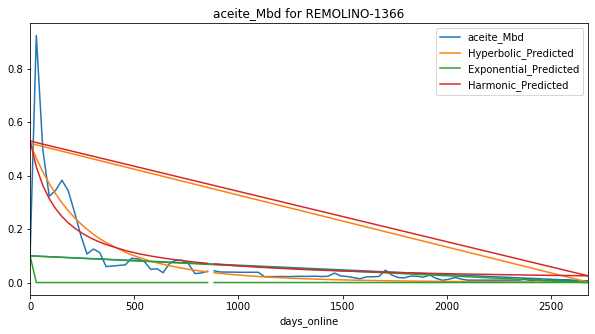

Exponential Fit Curve-fitted Variables: qi=0.4477589987143233, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.5677875424865826, b=0.8251471972188925, di=0.011188994118060826
Harmonic Fit Curve-fitted Variables: qi=0.5699830989625113, b=0.5699830989625113, di=0.013094905416411836


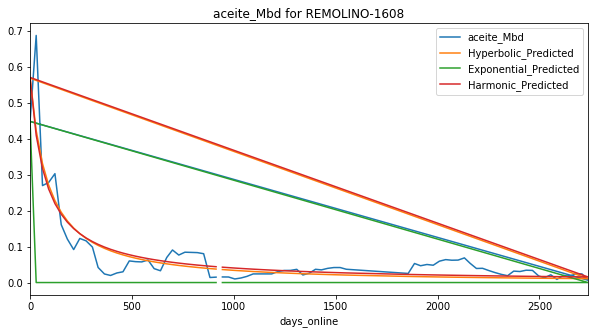

Exponential Fit Curve-fitted Variables: qi=0.046153679687500004, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.024593759206492764, b=1.0002089115980061e-06, di=4.901860620262151e-05
Harmonic Fit Curve-fitted Variables: qi=0.024567148327897692, b=0.024567148327897692, di=4.9005390313688246e-05


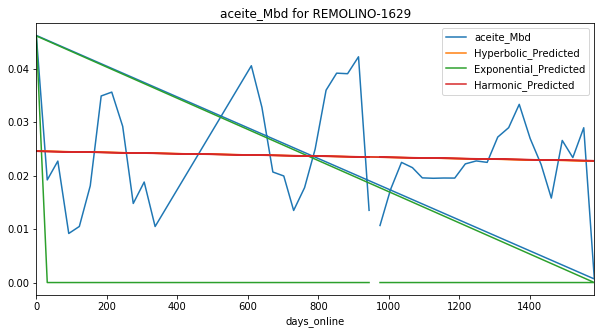

Exponential Fit Curve-fitted Variables: qi=0.6549299988036827, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.7953486744132616, b=0.4973088234244364, di=0.008508534199277678
Harmonic Fit Curve-fitted Variables: qi=0.8176410760361226, b=0.8176410760361226, di=0.013981019581766148


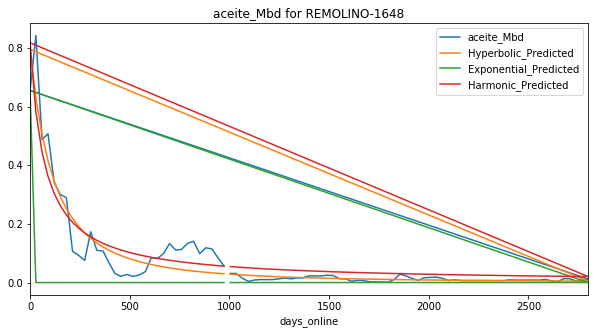

Exponential Fit Curve-fitted Variables: qi=0.036627322265625005, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.025897165718008132, b=5.190418119998678e-07, di=8.97733851347152e-05
Harmonic Fit Curve-fitted Variables: qi=0.0257609206600453, b=0.0257609206600453, di=9.167135498097495e-05


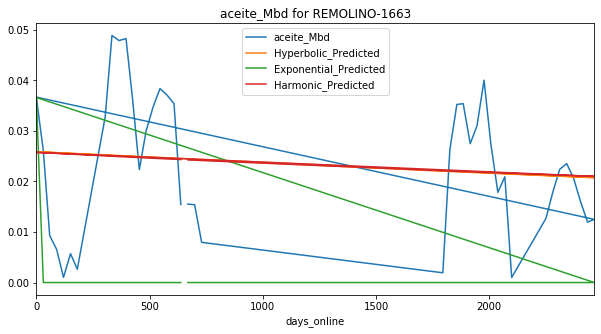

Exponential Fit Curve-fitted Variables: qi=0.053151989467731815, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.02963023326733222, b=5.410507566021052e-06, di=0.00010001488404572319
Harmonic Fit Curve-fitted Variables: qi=0.029562895163220554, b=0.029562895163220554, di=0.0001050722660534485


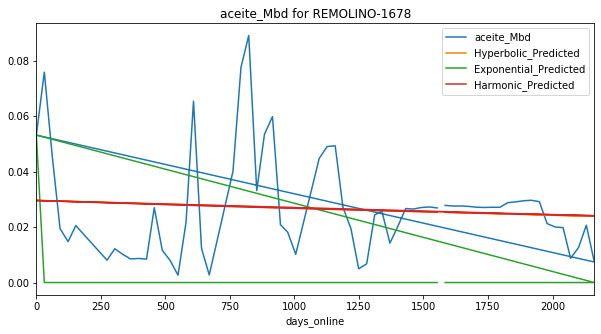

Exponential Fit Curve-fitted Variables: qi=0.014854002640361083, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.025316871354159755, b=9.046037616695742e-08, di=0.00021035064492840649
Harmonic Fit Curve-fitted Variables: qi=0.0252084034909356, b=0.0252084034909356, di=0.00022655174845980273


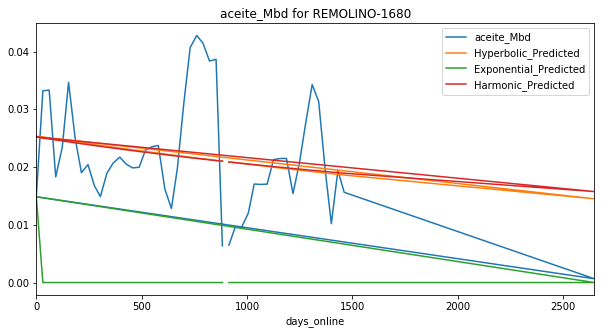

Exponential Fit Curve-fitted Variables: qi=0.02760301352528218, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.023736162630665386, b=1.999999375393499, di=8.859376350353031e-17
Harmonic Fit Curve-fitted Variables: qi=0.023736162713539736, b=0.023736162713539736, di=2.763964834173377e-16


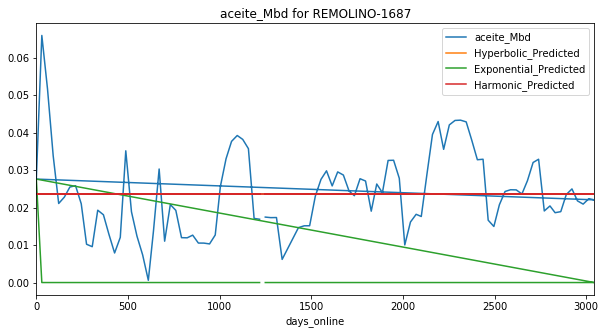

Exponential Fit Curve-fitted Variables: qi=0.01965100261242522, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.023575939664976273, b=1.9999999999916966, di=1.095131032665041e-15
Harmonic Fit Curve-fitted Variables: qi=0.023575939763530784, b=0.023575939763530784, di=4.626585606041347e-17


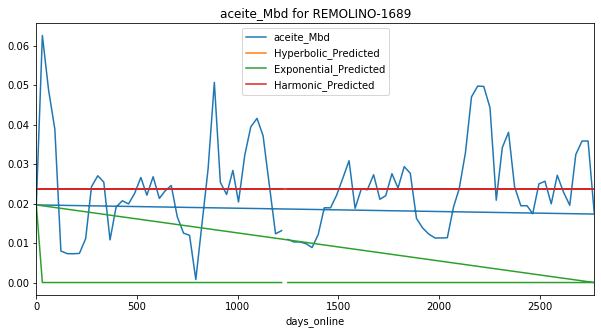

Exponential Fit Curve-fitted Variables: qi=0.003956792930158761, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03142454850905969, b=2.2863712146518623e-07, di=0.0001585917947769173
Harmonic Fit Curve-fitted Variables: qi=0.029979910909430387, b=0.029979910909430387, di=0.00014758595974031824


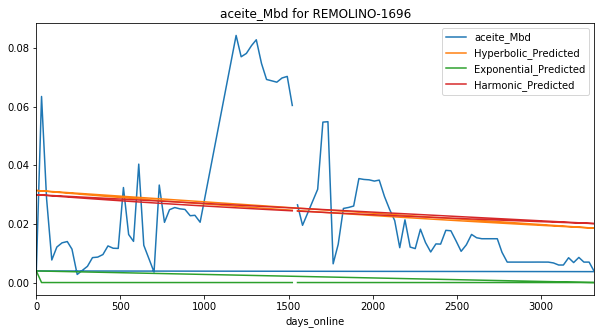

Exponential Fit Curve-fitted Variables: qi=0.04302699984743521, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.023886108564356485, b=0.00048173914956748873, di=3.0642948603568758e-06
Harmonic Fit Curve-fitted Variables: qi=0.023881049607613544, b=0.023881049607613544, di=2.9215061989534585e-06


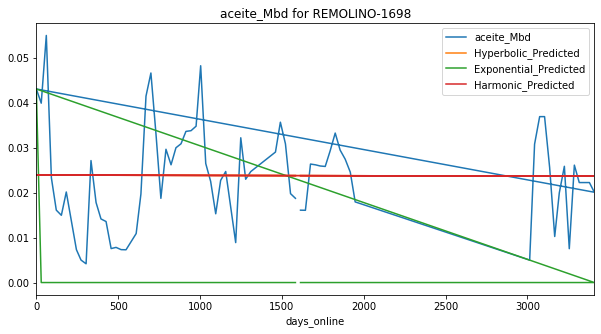

Exponential Fit Curve-fitted Variables: qi=0.1120272724609375, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.11187836615551561, b=1.1473265994743076, di=0.017232599268051388
Harmonic Fit Curve-fitted Variables: qi=0.10976965591074464, b=0.10976965591074464, di=0.014467011548858816


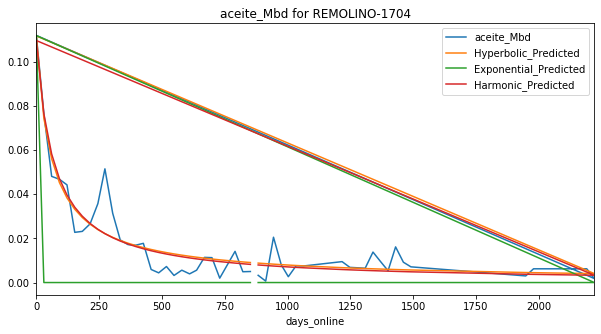

Exponential Fit Curve-fitted Variables: qi=0.19241100001022868, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.5761447347276005, b=0.030320220717281715, di=0.004357659621907679
Harmonic Fit Curve-fitted Variables: qi=0.5597025193496648, b=0.5597025193496648, di=0.008369334497838238


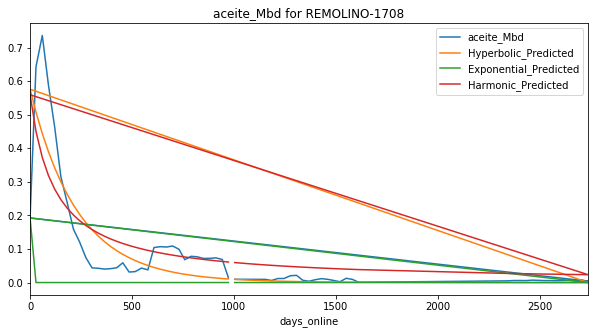

Exponential Fit Curve-fitted Variables: qi=0.11606098369430343, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.15515575252186783, b=0.9369994257946667, di=0.007553025800515955
Harmonic Fit Curve-fitted Variables: qi=0.1558270307194883, b=0.1558270307194883, di=0.008025767957145151


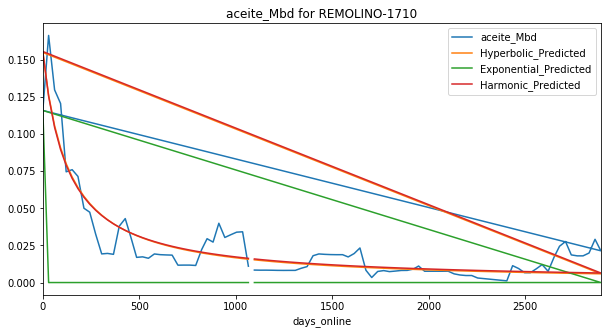

Exponential Fit Curve-fitted Variables: qi=0.029199044466292845, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1430791379633757, b=0.3495342780084891, di=0.0034465633747098883
Harmonic Fit Curve-fitted Variables: qi=0.14300622861419143, b=0.14300622861419143, di=0.005488329681532896


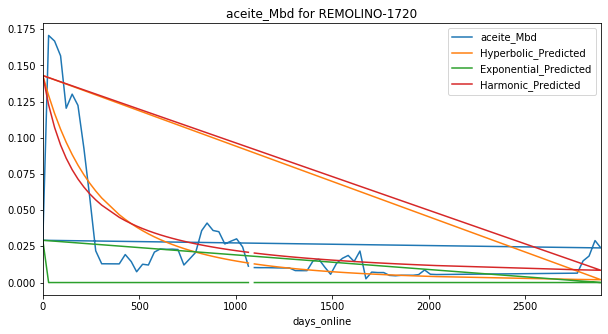

Exponential Fit Curve-fitted Variables: qi=0.025602191147857653, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.021219848348008233, b=1.999999999999959, di=7.523545992322322e-05
Harmonic Fit Curve-fitted Variables: qi=0.021110939438926543, b=0.021110939438926543, di=6.595657166988496e-05


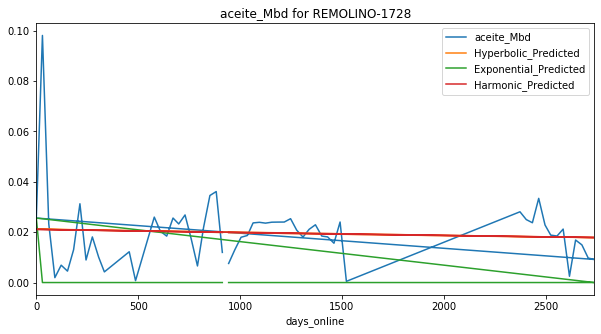

Exponential Fit Curve-fitted Variables: qi=0.03239100017913191, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.15597561102603671, b=0.877506510991031, di=0.00566841589992222
Harmonic Fit Curve-fitted Variables: qi=0.1560579416495009, b=0.1560579416495009, di=0.006238776942547393


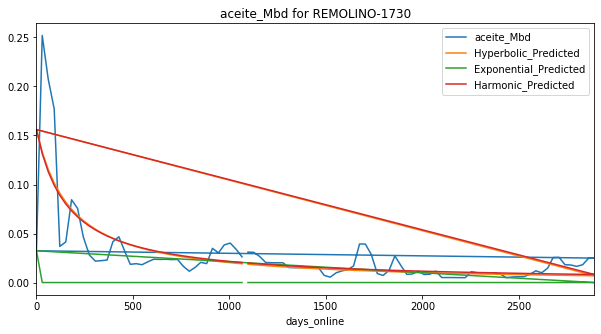

Exponential Fit Curve-fitted Variables: qi=0.16552099236249687, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.16979899999999312, b=1.334266913042307, di=0.017750232083658935
Harmonic Fit Curve-fitted Variables: qi=0.16979899999999998, b=0.16979899999999998, di=0.013016660727567696


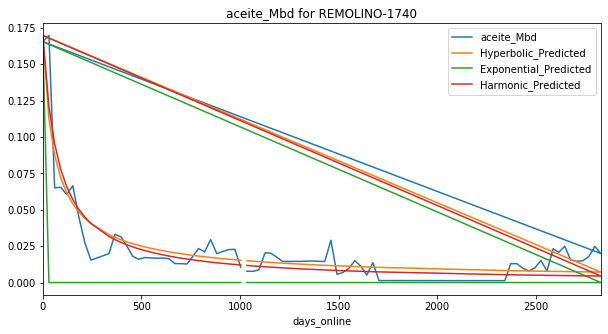

Exponential Fit Curve-fitted Variables: qi=0.16808699750184428, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.2232015210934035, b=0.7469140537358301, di=0.0061241842328830535
Harmonic Fit Curve-fitted Variables: qi=0.2245478039417329, b=0.2245478039417329, di=0.0075240972936289445


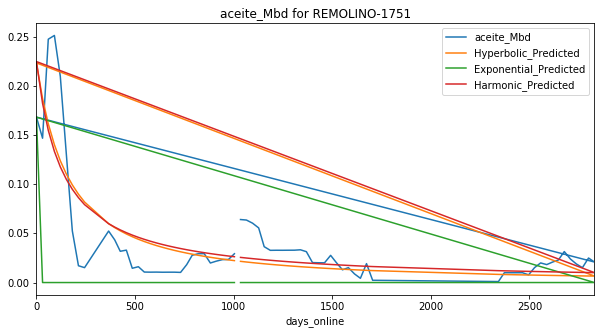

Exponential Fit Curve-fitted Variables: qi=0.09132400092176882, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.24248276388828724, b=2.5250978148096664e-15, di=0.0029588684838310598
Harmonic Fit Curve-fitted Variables: qi=0.24019137221011894, b=0.24019137221011894, di=0.00607304443223233


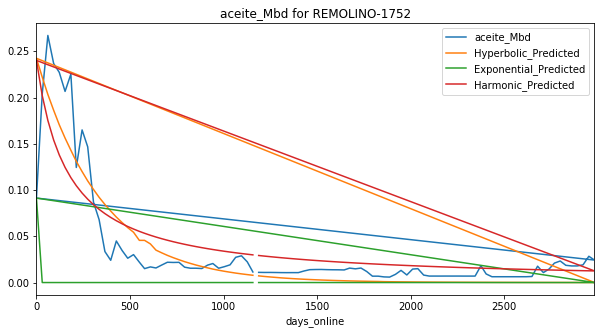

Exponential Fit Curve-fitted Variables: qi=0.03394409940629703, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.08769049787296584, b=1.261905183905526, di=0.002873449156187266
Harmonic Fit Curve-fitted Variables: qi=0.08459859038487239, b=0.08459859038487239, di=0.0022364803717547415


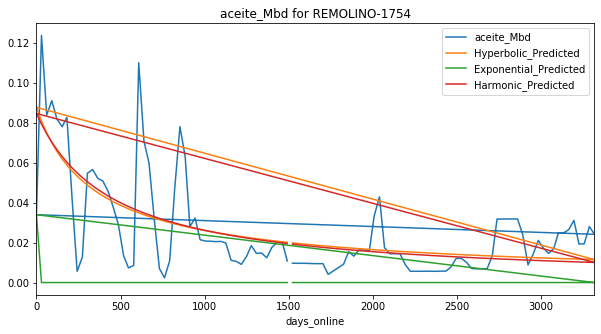

Exponential Fit Curve-fitted Variables: qi=0.003733050377768462, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.08879497875168, b=1.0251965659070403, di=0.003778200971118088
Harmonic Fit Curve-fitted Variables: qi=0.08868215066860187, b=0.08868215066860187, di=0.0037055378976377684


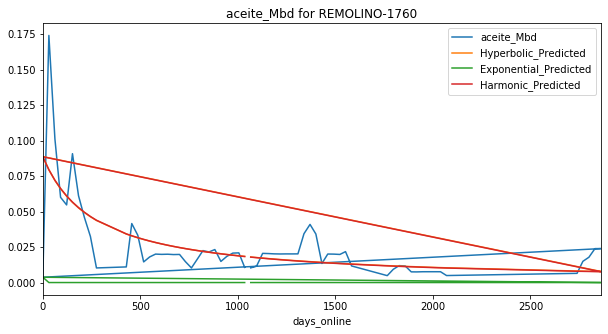

Exponential Fit Curve-fitted Variables: qi=0.052165376187643324, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.06387531299077945, b=1.874661432233931, di=0.006845099127577666
Harmonic Fit Curve-fitted Variables: qi=0.057638843371148614, b=0.057638843371148614, di=0.003030831402313402


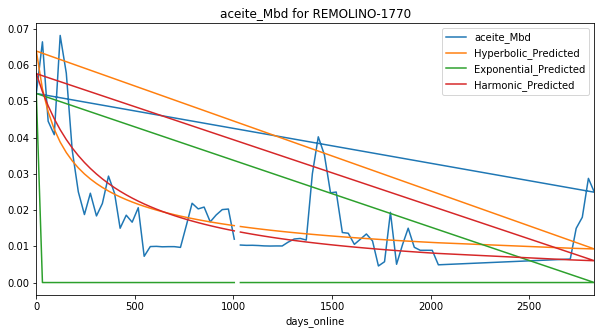

Exponential Fit Curve-fitted Variables: qi=0.032145010446554496, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.44022405071030757, b=1.0368253564935712e-13, di=0.0038726197277800874
Harmonic Fit Curve-fitted Variables: qi=0.4020835631880954, b=0.4020835631880954, di=0.0073175101030628995


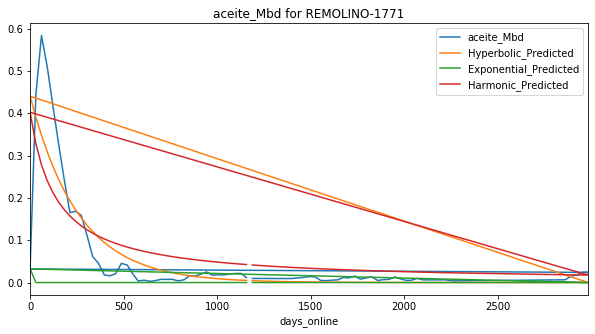

Exponential Fit Curve-fitted Variables: qi=0.08622200000072579, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1842503563378117, b=0.487400870912221, di=0.004011000720885113
Harmonic Fit Curve-fitted Variables: qi=0.18555385505414465, b=0.18555385505414465, di=0.005976273097618


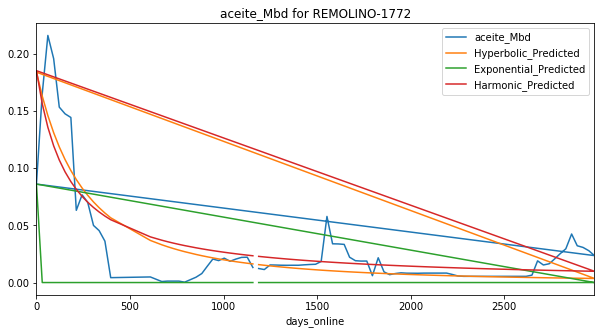

Exponential Fit Curve-fitted Variables: qi=0.17856999993519443, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1984778151547402, b=1.4477640121977955, di=0.02226074842479225
Harmonic Fit Curve-fitted Variables: qi=0.19537180720552785, b=0.19537180720552785, di=0.014157584367981535


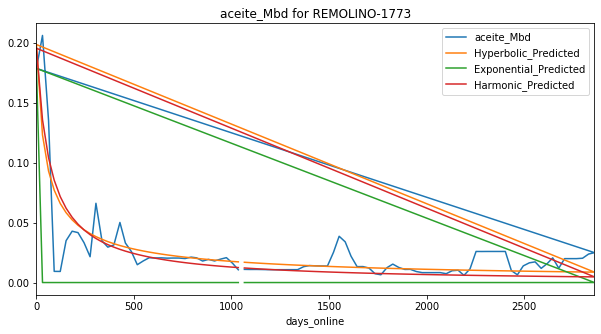

Exponential Fit Curve-fitted Variables: qi=0.08746798422042301, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0967149000254973, b=1.9999999999998652, di=0.00822700279516767
Harmonic Fit Curve-fitted Variables: qi=0.06270239491317509, b=0.06270239491317509, di=0.001413946381784828


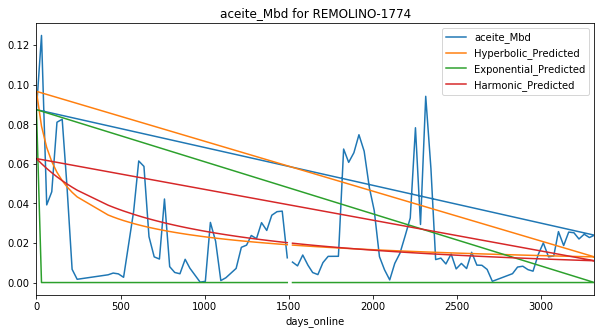

Exponential Fit Curve-fitted Variables: qi=0.08419429116834445, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.08641632841639031, b=1.999999999999943, di=0.008779166603449282
Harmonic Fit Curve-fitted Variables: qi=0.06649315503372563, b=0.06649315503372563, di=0.0022756864469329883


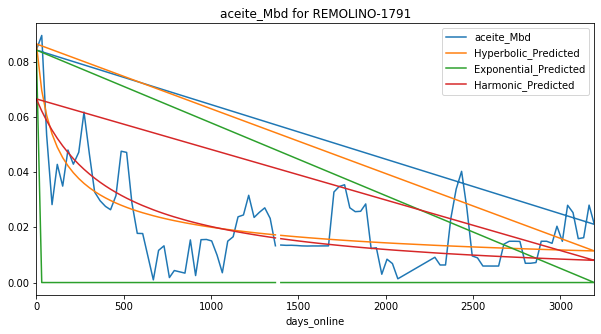

Exponential Fit Curve-fitted Variables: qi=0.02418300082375944, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.06351146563954925, b=0.46655179323539037, di=0.0017441570496593334
Harmonic Fit Curve-fitted Variables: qi=0.06594024107890059, b=0.06594024107890059, di=0.0025903538752115266


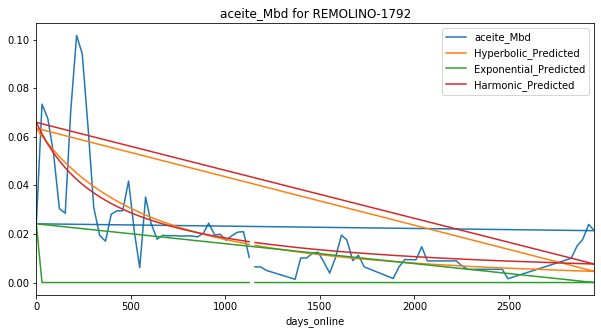

Exponential Fit Curve-fitted Variables: qi=0.118268999662622, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.17400516430261176, b=7.023979956259154e-09, di=0.003680386289046777
Harmonic Fit Curve-fitted Variables: qi=0.17275754647391184, b=0.17275754647391184, di=0.007319025993739115


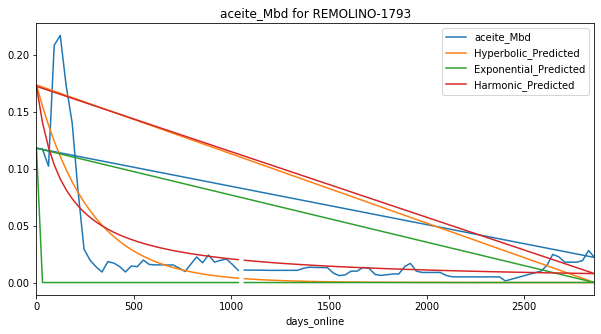

Exponential Fit Curve-fitted Variables: qi=0.063053000000702, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.20526080234616534, b=6.522401636230697e-09, di=0.0031875015737023236
Harmonic Fit Curve-fitted Variables: qi=0.19881283281885942, b=0.19881283281885942, di=0.006246081904763409


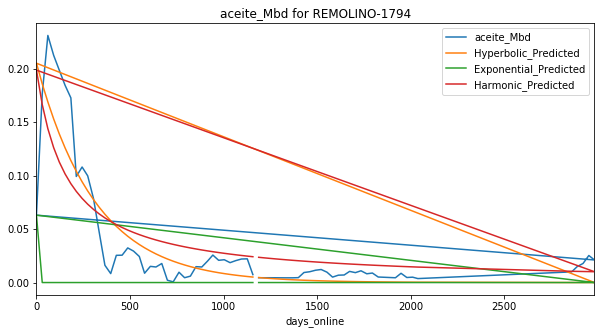

Exponential Fit Curve-fitted Variables: qi=0.007852000875328771, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03752280450407855, b=1.494781691615228, di=0.0025546401482537595
Harmonic Fit Curve-fitted Variables: qi=0.036593777074505736, b=0.036593777074505736, di=0.0019288974093707425


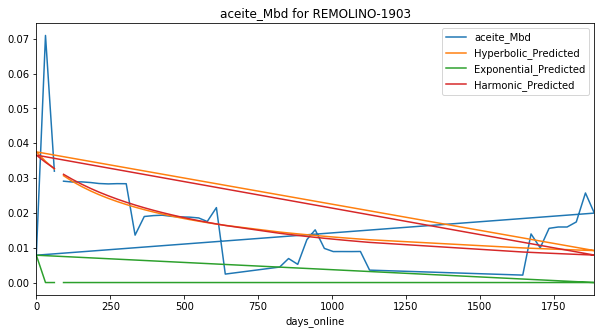

Exponential Fit Curve-fitted Variables: qi=0.03399000264862042, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.07161688418947917, b=1.2116638135957838, di=0.002423630848676656
Harmonic Fit Curve-fitted Variables: qi=0.07083095649416392, b=0.07083095649416392, di=0.002166205166955928


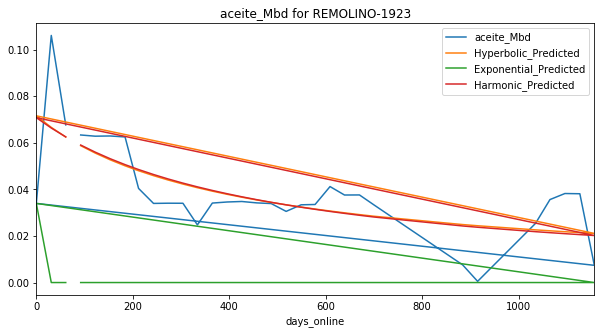

Exponential Fit Curve-fitted Variables: qi=0.03461400018755781, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.09951499999999998, b=0.06612615066145403, di=0.0019215243401971734
Harmonic Fit Curve-fitted Variables: qi=0.09951499999999008, b=0.09951499999999008, di=0.003380466196385553


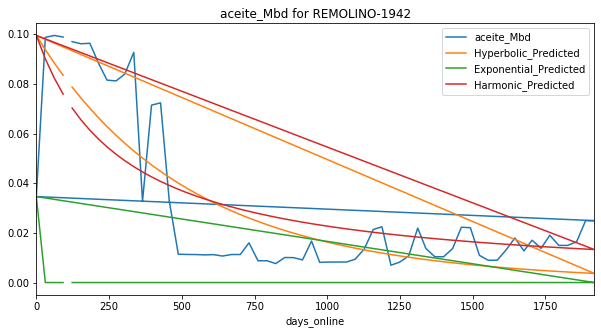

Exponential Fit Curve-fitted Variables: qi=0.0876273427734375, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0744543717144222, b=3.8412545129789706e-08, di=0.0012366735340585981
Harmonic Fit Curve-fitted Variables: qi=0.07919418277207718, b=0.07919418277207718, di=0.002432890550997171


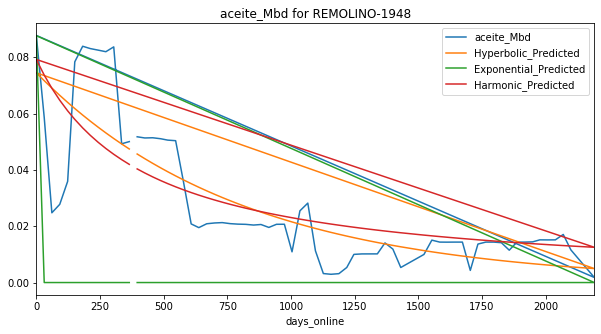

Exponential Fit Curve-fitted Variables: qi=0.10246690312460814, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1698453728219524, b=0.2545380841940342, di=0.001681638190575508
Harmonic Fit Curve-fitted Variables: qi=0.18515582907323205, b=0.18515582907323205, di=0.0032158183616278375


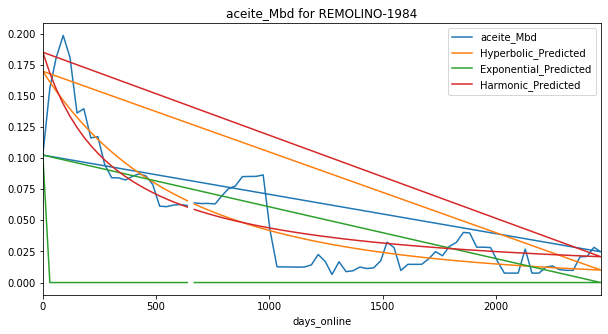

Exponential Fit Curve-fitted Variables: qi=0.15526799989336162, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.21342207511040803, b=0.7951771579147161, di=0.002998435507850731
Harmonic Fit Curve-fitted Variables: qi=0.21899073410382575, b=0.21899073410382575, di=0.003652302870440489


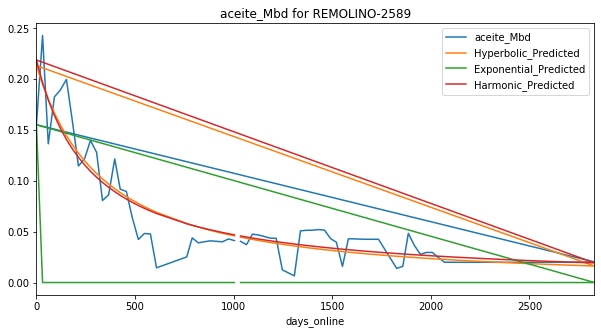

Exponential Fit Curve-fitted Variables: qi=0.045422111328125, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.020442684523078864, b=1.999999999896052, di=0.0005193738961054786
Harmonic Fit Curve-fitted Variables: qi=0.01978050873152236, b=0.01978050873152236, di=0.0003522562711925704


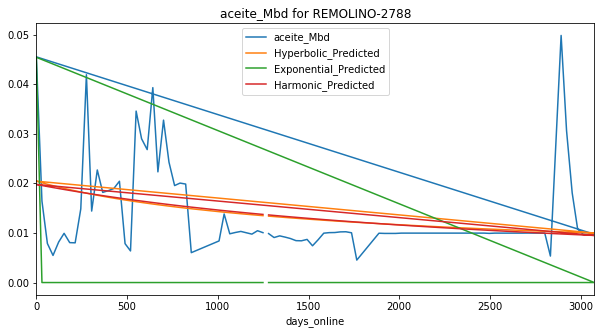

Exponential Fit Curve-fitted Variables: qi=0.6419856230468751, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.6420639999999849, b=1.60452947283266, di=0.013029848845610356
Harmonic Fit Curve-fitted Variables: qi=0.5869758848978087, b=0.5869758848978087, di=0.0064940869640704585


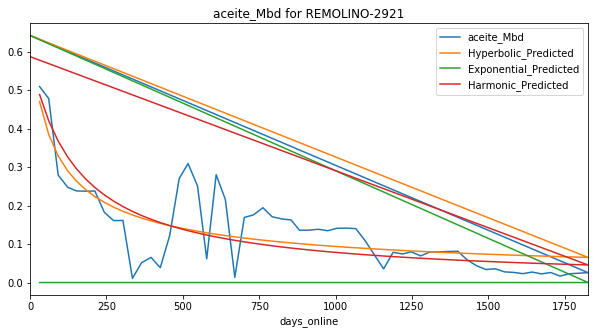

Exponential Fit Curve-fitted Variables: qi=0.09545299819336063, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.14797926176681903, b=8.232308985009286e-07, di=0.0036442511212858163
Harmonic Fit Curve-fitted Variables: qi=0.15518125657957121, b=0.15518125657957121, di=0.007982335861623623


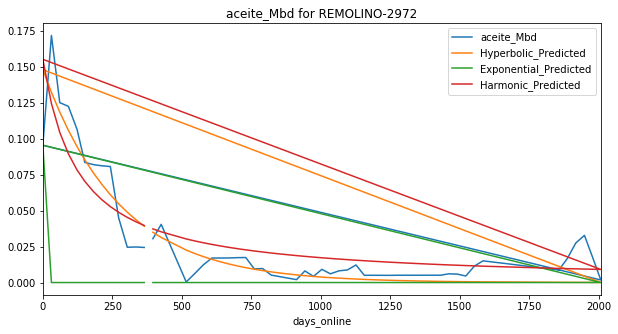

Exponential Fit Curve-fitted Variables: qi=0.05634901021830633, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.40749231433540356, b=0.14354076421530318, di=0.0023571233583286923
Harmonic Fit Curve-fitted Variables: qi=0.42523298582577107, b=0.42523298582577107, di=0.004549886010138675


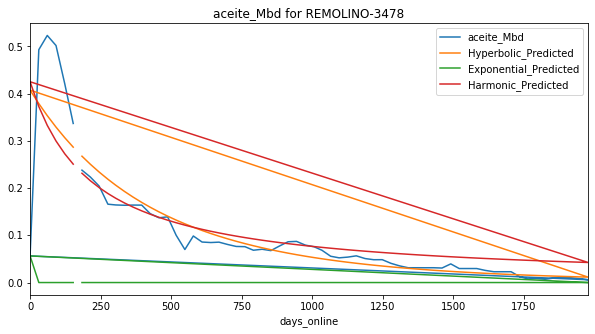

Exponential Fit Curve-fitted Variables: qi=0.08611000015823923, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.06734907625191451, b=0.4814718042234696, di=1.0088381217513969e-16
Harmonic Fit Curve-fitted Variables: qi=0.06734918302924822, b=0.06734918302924822, di=1.7521852885961635e-17


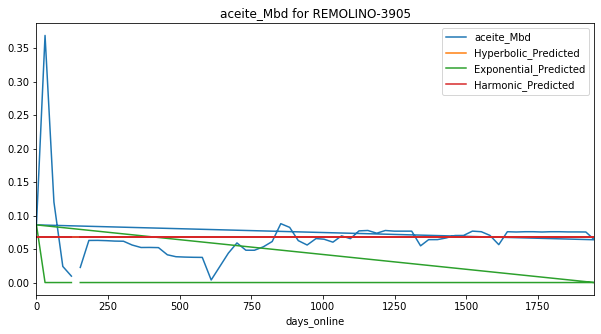

Exponential Fit Curve-fitted Variables: qi=0.2682754870605468, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.2683409999999995, b=0.9802093628916573, di=0.009839780057656237
Harmonic Fit Curve-fitted Variables: qi=0.26834099999999994, b=0.26834099999999994, di=0.010015980350247517


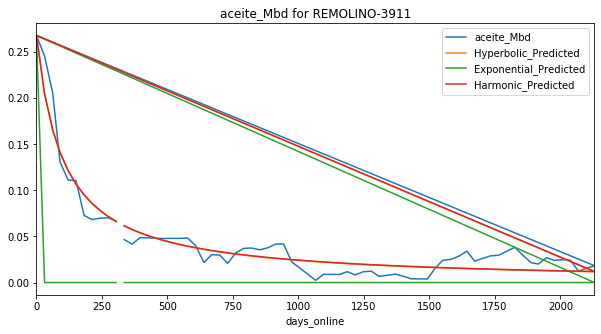

Exponential Fit Curve-fitted Variables: qi=0.21662499997574938, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.3068313154790106, b=0.8454095954758244, di=0.008100397129087021
Harmonic Fit Curve-fitted Variables: qi=0.3076741865539379, b=0.3076741865539379, di=0.009158354629554472


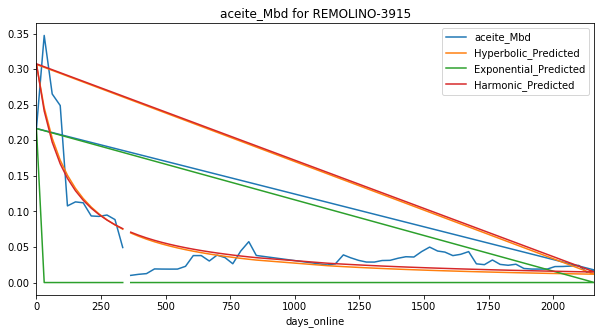

Exponential Fit Curve-fitted Variables: qi=0.4596129995188529, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.8535959999985264, b=2.1767798387638188e-11, di=0.0023824097513696356
Harmonic Fit Curve-fitted Variables: qi=0.8535959999996766, b=0.8535959999996766, di=0.004829785449390546


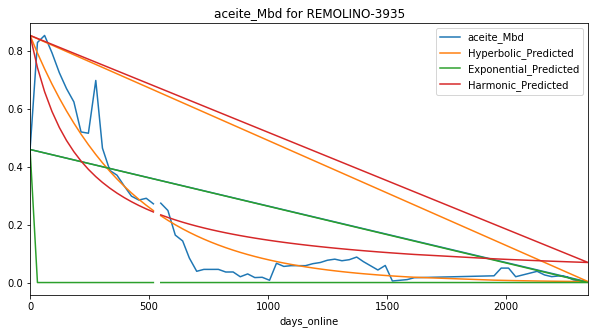

Exponential Fit Curve-fitted Variables: qi=0.006878000607305601, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.04782369273677226, b=1.99999999999939, di=0.004149717862328047
Harmonic Fit Curve-fitted Variables: qi=0.044519722675470726, b=0.044519722675470726, di=0.002165041992017719


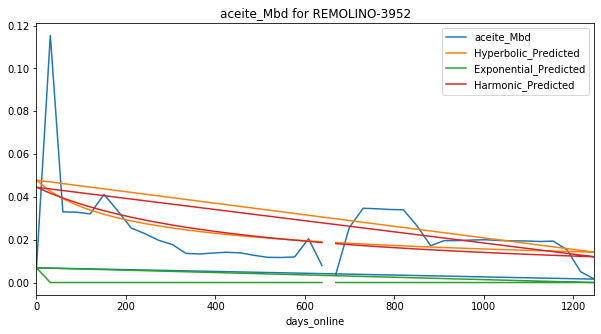

Exponential Fit Curve-fitted Variables: qi=0.5473181805419922, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.5473849999999999, b=1.1953331069345157, di=0.031674703192540926
Harmonic Fit Curve-fitted Variables: qi=0.5473849999999999, b=0.5473849999999999, di=0.026352128874281292


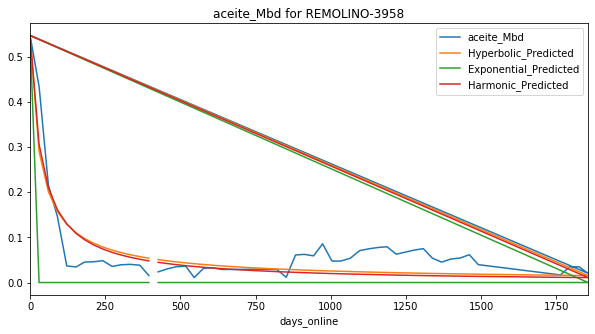

Exponential Fit Curve-fitted Variables: qi=0.07392700000038697, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.09940526658871802, b=1.7623161149697788, di=0.013923012170799231
Harmonic Fit Curve-fitted Variables: qi=0.08769040804570913, b=0.08769040804570913, di=0.005704830365506184


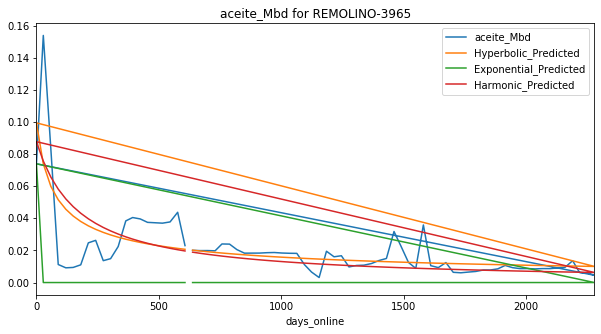

Exponential Fit Curve-fitted Variables: qi=0.11845599999465804, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.06702788971649691, b=1.9999999999999998, di=0.0005769803273263859
Harmonic Fit Curve-fitted Variables: qi=0.06386429409377571, b=0.06386429409377571, di=0.0003749619399119717


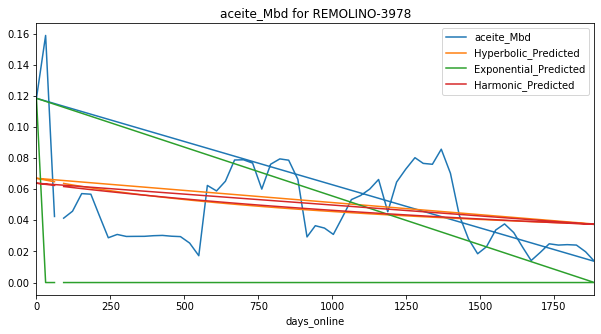

Exponential Fit Curve-fitted Variables: qi=0.13319699990891154, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.17333499999999996, b=0.025521308781205378, di=0.002657657242360216
Harmonic Fit Curve-fitted Variables: qi=0.17333499999999996, b=0.17333499999999996, di=0.0050938096082918365


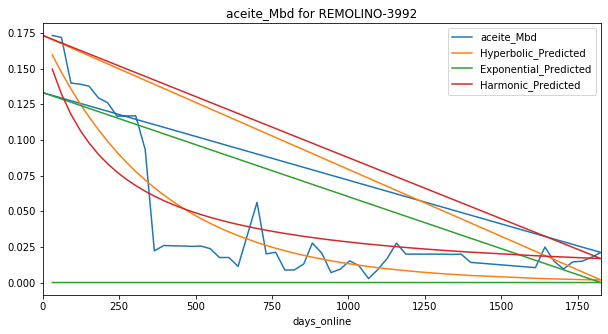

Exponential Fit Curve-fitted Variables: qi=0.023150000042863453, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.13425604252959947, b=4.351590996648971e-08, di=0.0023427192167703855
Harmonic Fit Curve-fitted Variables: qi=0.13749112682710052, b=0.13749112682710052, di=0.004691923537705654


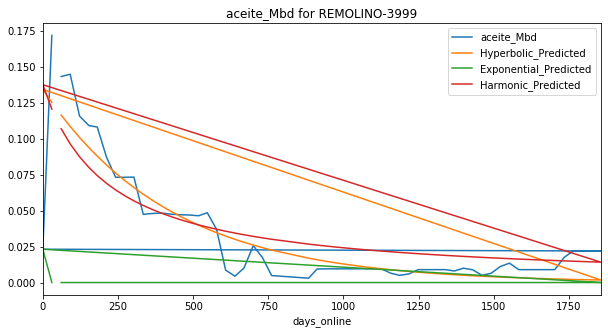

Exponential Fit Curve-fitted Variables: qi=0.06030299649906434, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.056344805190248905, b=1.9999999999999998, di=0.010845366630766273
Harmonic Fit Curve-fitted Variables: qi=0.031207772120443414, b=0.031207772120443414, di=0.001122198830628851


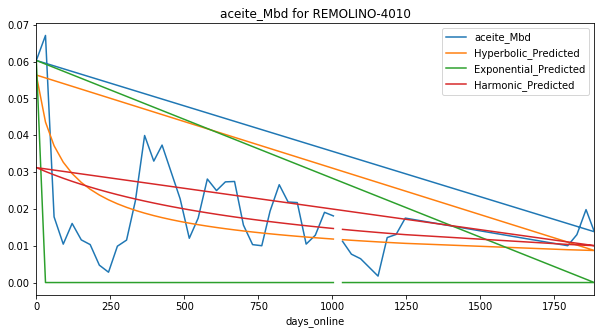

Exponential Fit Curve-fitted Variables: qi=0.02919102050174819, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.043679947128743575, b=1.9999999999999998, di=0.0027541259121344973
Harmonic Fit Curve-fitted Variables: qi=0.028547608814383625, b=0.028547608814383625, di=0.00032131947399997656


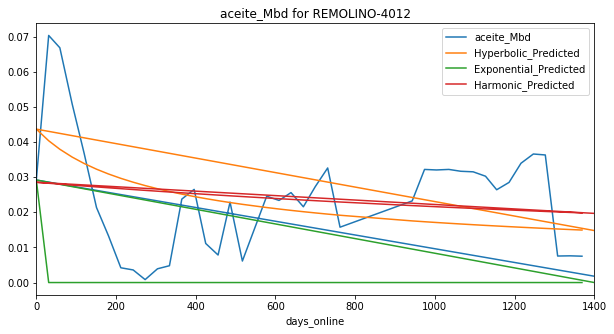

Exponential Fit Curve-fitted Variables: qi=0.03966437890625, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.022781959755478823, b=1.989971396492474, di=3.946890491882834e-15
Harmonic Fit Curve-fitted Variables: qi=0.022781960012657972, b=0.022781960012657972, di=9.043666475843129e-13


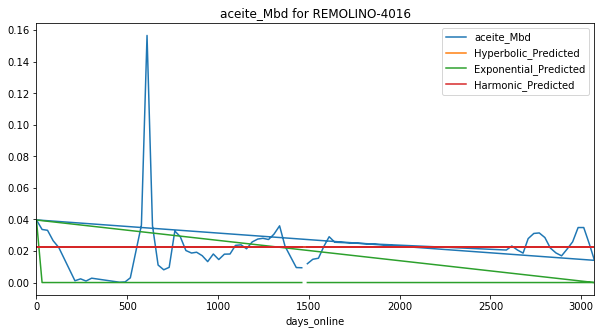

Exponential Fit Curve-fitted Variables: qi=0.16558099390789083, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.19205527318758847, b=1.4784487388135152, di=0.02522627229160246
Harmonic Fit Curve-fitted Variables: qi=0.1966906783566235, b=0.1966906783566235, di=0.018044816188323123


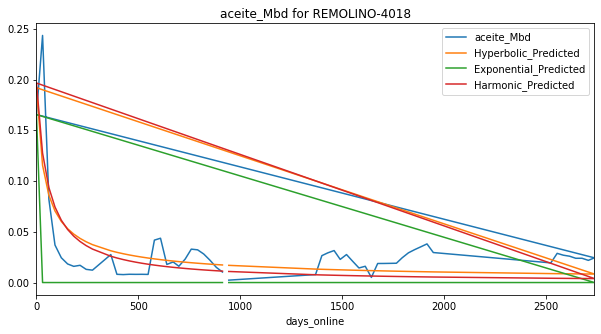

Exponential Fit Curve-fitted Variables: qi=0.06044599973769578, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.023850056224922936, b=0.47310202704207516, di=5.45699254728775e-19
Harmonic Fit Curve-fitted Variables: qi=0.023850056061117206, b=0.023850056061117206, di=8.63081836902517e-15


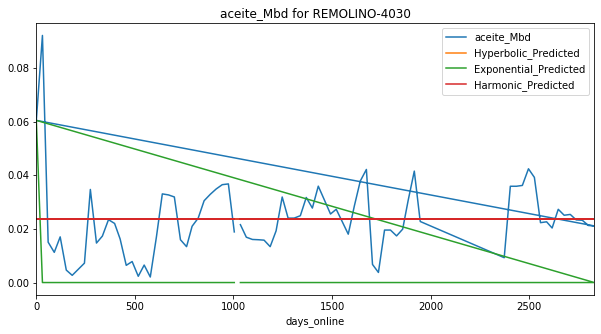

Exponential Fit Curve-fitted Variables: qi=0.06458400060095953, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.18239726188208774, b=0.7037856858989356, di=0.008808595342764725
Harmonic Fit Curve-fitted Variables: qi=0.17704067374478472, b=0.17704067374478472, di=0.010162014055319718


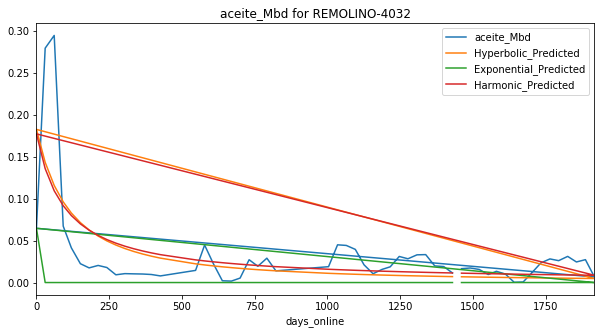

Exponential Fit Curve-fitted Variables: qi=0.062203002355551915, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.09741648530117229, b=1.9999999999937723, di=0.008162646163676426
Harmonic Fit Curve-fitted Variables: qi=0.09054794941268528, b=0.09054794941268528, di=0.003436549855702719


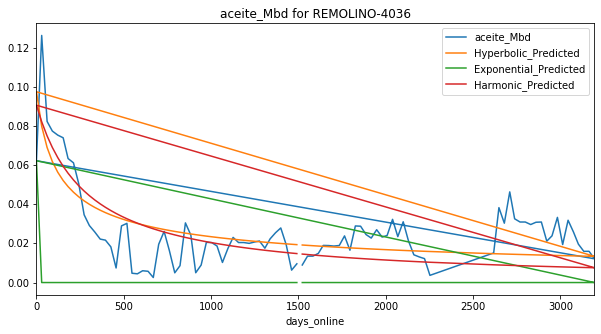

Exponential Fit Curve-fitted Variables: qi=0.027127069931541792, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.07057857749088688, b=1.9999999999999998, di=0.009078761218145638
Harmonic Fit Curve-fitted Variables: qi=0.06897246242380316, b=0.06897246242380316, di=0.004872743561661998


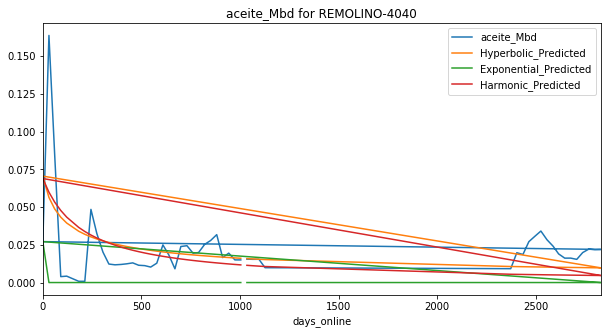

Exponential Fit Curve-fitted Variables: qi=0.01200365155358678, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.019688410566290216, b=4.675539243964577e-10, di=9.612554589614309e-16
Harmonic Fit Curve-fitted Variables: qi=0.019688410494549842, b=0.019688410494549842, di=7.471828321717032e-16


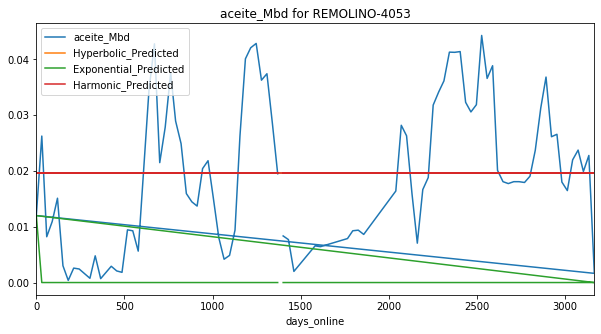

Exponential Fit Curve-fitted Variables: qi=0.17290399999299846, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.20255099999999998, b=0.965814788100327, di=0.008778066067475169
Harmonic Fit Curve-fitted Variables: qi=0.20255099999999998, b=0.20255099999999998, di=0.009010564479985005


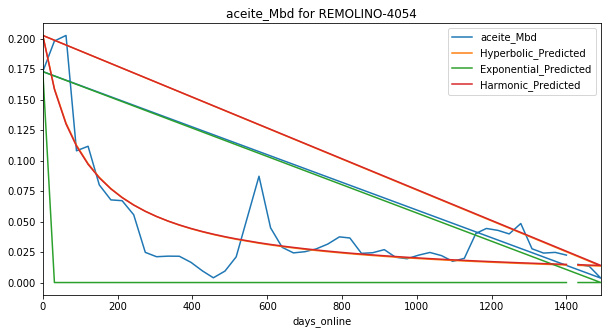

Exponential Fit Curve-fitted Variables: qi=0.11439193611512823, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.11558622354579998, b=1.9999999999999998, di=0.010937829804873605
Harmonic Fit Curve-fitted Variables: qi=0.060672146213299215, b=0.060672146213299215, di=0.0010623006992557754


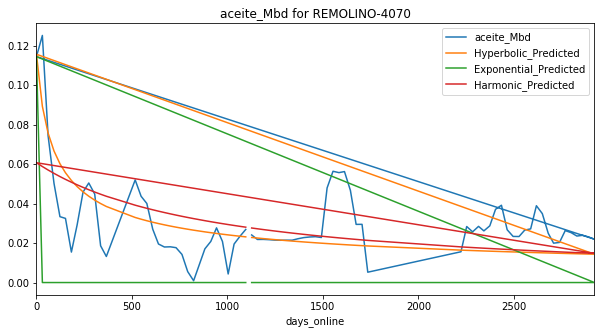

Exponential Fit Curve-fitted Variables: qi=0.009491000127372792, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.02112721198222091, b=1.9999966098779867, di=8.159954925144753e-06
Harmonic Fit Curve-fitted Variables: qi=0.021116074711518915, b=0.021116074711518915, di=7.73407072483227e-06


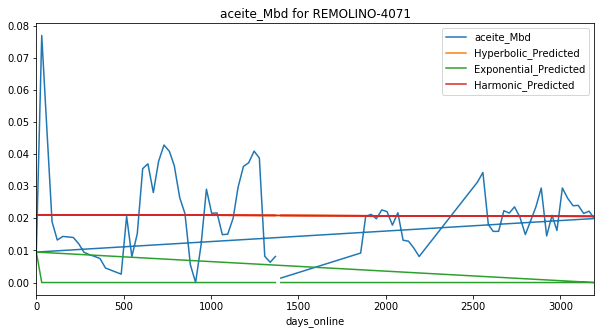

Exponential Fit Curve-fitted Variables: qi=0.07927499467256094, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.10915350820937586, b=1.0885019874225226, di=0.003078000550386742
Harmonic Fit Curve-fitted Variables: qi=0.10879295783441269, b=0.10879295783441269, di=0.002854966363475194


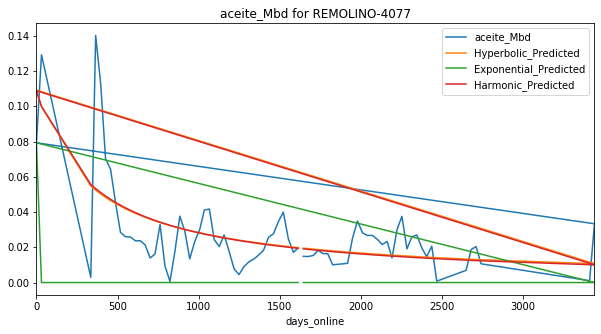

Exponential Fit Curve-fitted Variables: qi=0.012180000114543395, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03583156378415203, b=1.8469691447626357, di=0.0014049120857592193
Harmonic Fit Curve-fitted Variables: qi=0.034356636594572984, b=0.034356636594572984, di=0.0009302597516604255


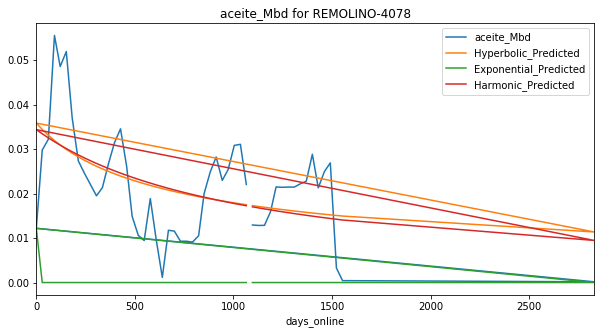

Exponential Fit Curve-fitted Variables: qi=0.058134999995139776, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.08249032695307995, b=1.999999999981713, di=0.005918420751870723
Harmonic Fit Curve-fitted Variables: qi=0.07139676573228114, b=0.07139676573228114, di=0.002261154392456479


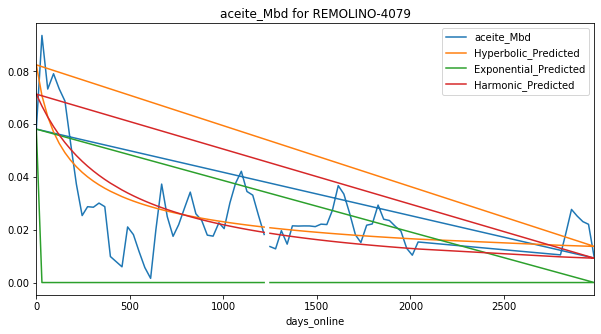

Exponential Fit Curve-fitted Variables: qi=0.02368615839471189, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.026705631715469125, b=1.9999999999999998, di=0.00015421099282414148
Harmonic Fit Curve-fitted Variables: qi=0.024802715057399408, b=0.024802715057399408, di=7.265272155034779e-05


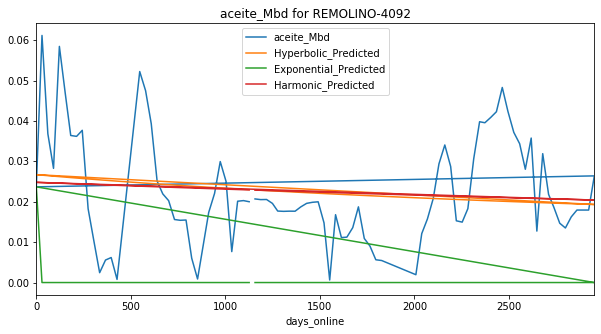

Exponential Fit Curve-fitted Variables: qi=0.012580019400431788, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.020642079160235225, b=1.999999999999824, di=2.8336738790272906e-20
Harmonic Fit Curve-fitted Variables: qi=0.02064207910733986, b=0.02064207910733986, di=1.2285973860947093e-15


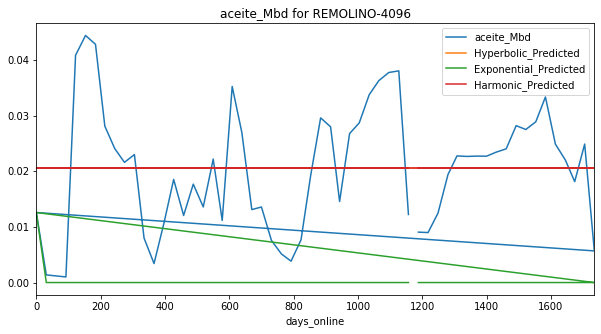

Exponential Fit Curve-fitted Variables: qi=0.0689436064453125, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.06284464831507325, b=1.9999999999952274, di=0.002702236761873501
Harmonic Fit Curve-fitted Variables: qi=0.055185063956461215, b=0.055185063956461215, di=0.0011694759818375738


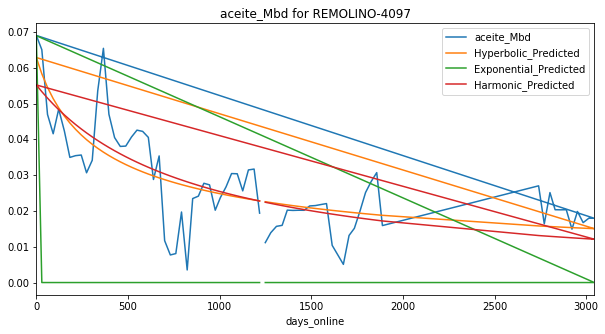

Exponential Fit Curve-fitted Variables: qi=0.172303826171875, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.17238799999999152, b=1.2651962926156048, di=0.015923835528448727
Harmonic Fit Curve-fitted Variables: qi=0.17238799999999999, b=0.17238799999999999, di=0.012334372649170224


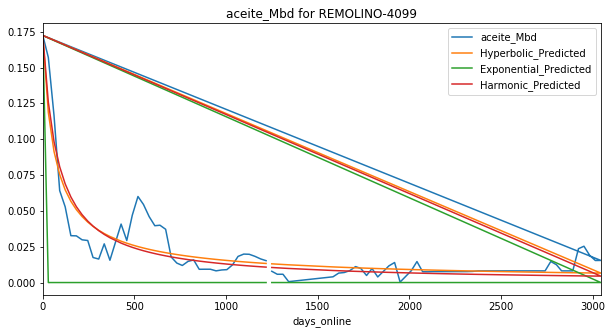

Exponential Fit Curve-fitted Variables: qi=0.008300055618291306, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.017575180074665915, b=5.064523007289323e-07, di=1.1232725116397501e-20
Harmonic Fit Curve-fitted Variables: qi=0.017575178382063197, b=0.017575178382063197, di=7.66083983349968e-14


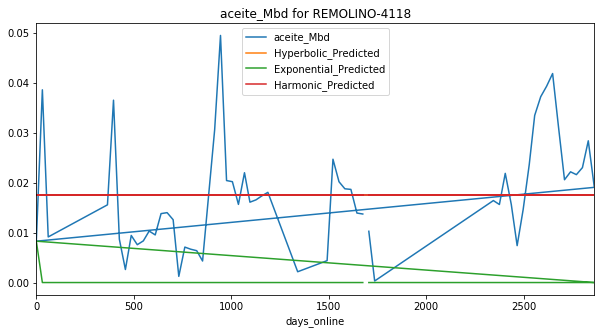

Exponential Fit Curve-fitted Variables: qi=0.08394297734315948, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0822321720071975, b=1.999999999688113, di=0.008409565953330126
Harmonic Fit Curve-fitted Variables: qi=0.06679724281967772, b=0.06679724281967772, di=0.0026931991835718026


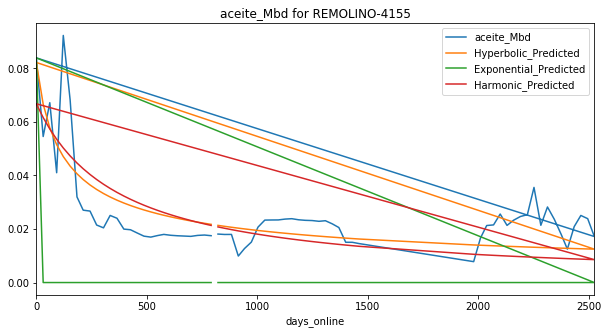

Exponential Fit Curve-fitted Variables: qi=0.15278136328124997, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1528559999999999, b=0.7012479994002901, di=0.008383769875271379
Harmonic Fit Curve-fitted Variables: qi=0.15285599999999996, b=0.15285599999999996, di=0.010985035515548537


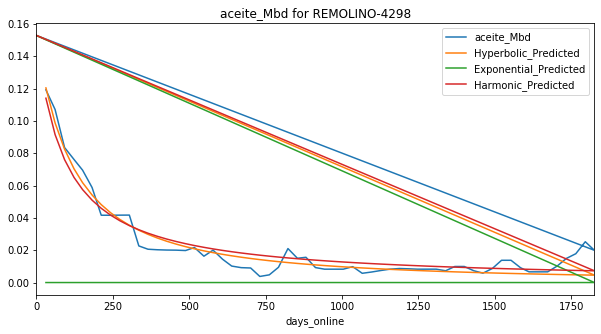

Exponential Fit Curve-fitted Variables: qi=0.11658400209137611, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.3455118272970263, b=0.27777014959001417, di=0.004579256817861352
Harmonic Fit Curve-fitted Variables: qi=0.3451790148838307, b=0.3451790148838307, di=0.0077350185270205684


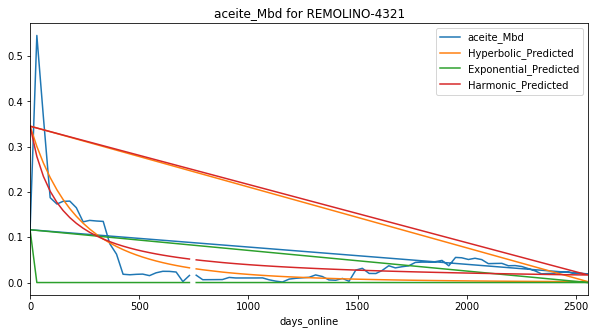

Exponential Fit Curve-fitted Variables: qi=0.008022004521725877, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.020249582432046002, b=1.9999999999348554, di=9.840203431899338e-14
Harmonic Fit Curve-fitted Variables: qi=0.020249581876171523, b=0.020249581876171523, di=4.5198433088697003e-13


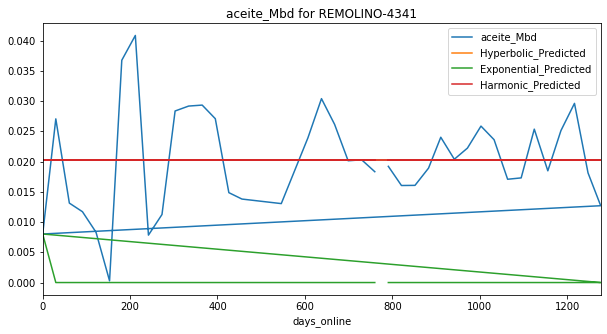

Exponential Fit Curve-fitted Variables: qi=0.0010034275898261765, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.014962526242446771, b=3.173133245049087e-07, di=1.08189323295395e-14
Harmonic Fit Curve-fitted Variables: qi=0.014962526650446529, b=0.014962526650446529, di=2.2026136500714777e-17


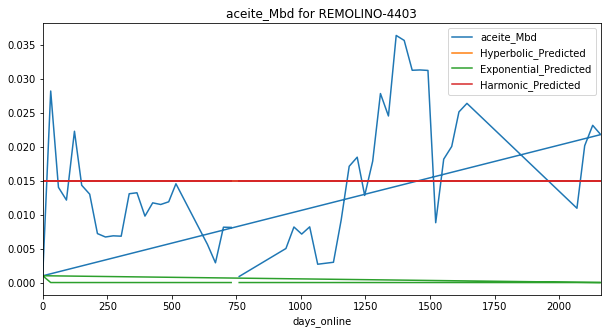

Exponential Fit Curve-fitted Variables: qi=0.0008133533607935723, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.02444440709903394, b=1.9999998796637155, di=8.171519477990938e-05
Harmonic Fit Curve-fitted Variables: qi=0.02440935558939305, b=0.02440935558939305, di=7.46952985789393e-05


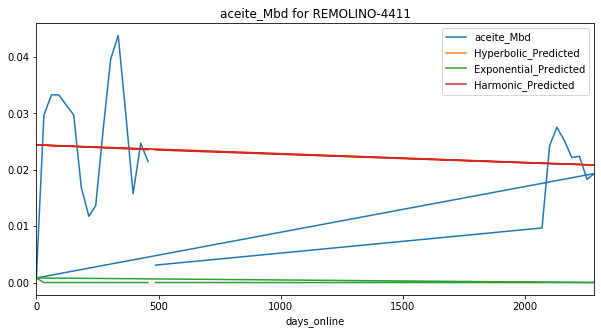

Exponential Fit Curve-fitted Variables: qi=0.16752516064453127, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1664418441830025, b=1.9999999999999998, di=0.1079171684575552
Harmonic Fit Curve-fitted Variables: qi=0.15327906650561235, b=0.15327906650561235, di=0.028274868271232413


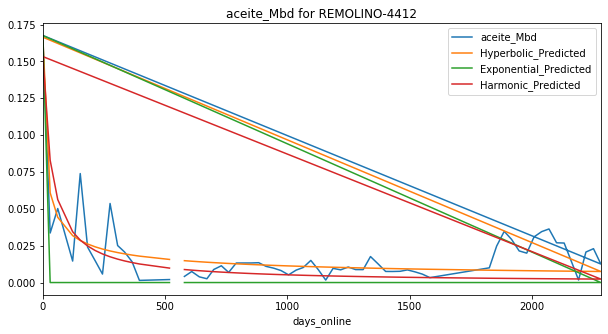

Exponential Fit Curve-fitted Variables: qi=0.008885619112271414, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.022123198344749663, b=1.9253539714671917, di=0.001866024256742108
Harmonic Fit Curve-fitted Variables: qi=0.02096680850810338, b=0.02096680850810338, di=0.0011558149107443393


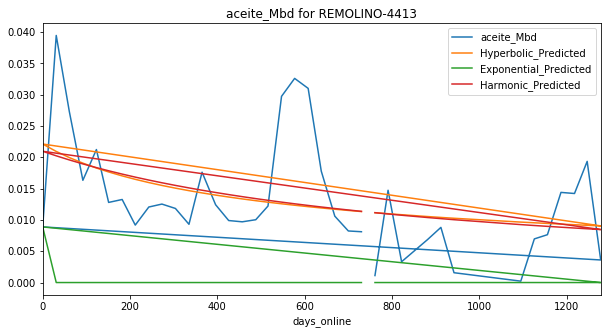

Exponential Fit Curve-fitted Variables: qi=0.006865027389314116, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.017748601075877373, b=1.9999999999999998, di=5.264738846789935e-14
Harmonic Fit Curve-fitted Variables: qi=0.017748598231488423, b=0.017748598231488423, di=7.058378890869494e-13


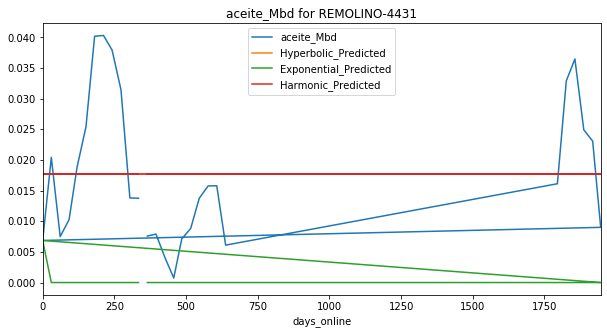

Exponential Fit Curve-fitted Variables: qi=0.08382500000404974, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.2234573823727888, b=0.3561464189210457, di=0.005232247096915759
Harmonic Fit Curve-fitted Variables: qi=0.22154473693717516, b=0.22154473693717516, di=0.008271557256601659


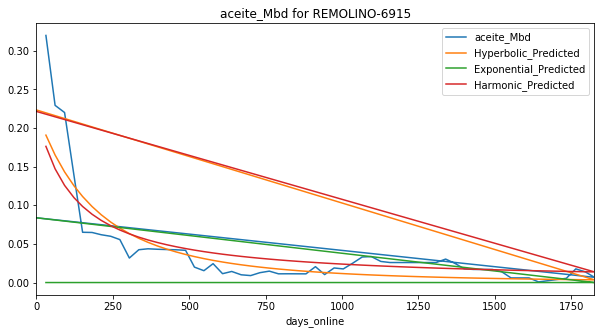

Exponential Fit Curve-fitted Variables: qi=0.028267001256876874, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.025267144302031072, b=1.9999999999999998, di=6.054160234280297e-05
Harmonic Fit Curve-fitted Variables: qi=0.025134000161529297, b=0.025134000161529297, di=5.2307262021577476e-05


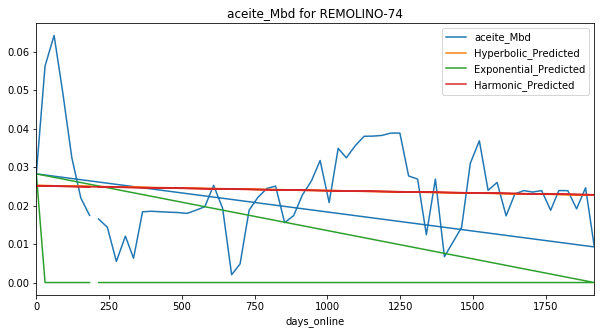

Exponential Fit Curve-fitted Variables: qi=0.2641075048828124, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.24803350554550266, b=1.9999999999999998, di=0.003747403696442177
Harmonic Fit Curve-fitted Variables: qi=0.15047594682159046, b=0.15047594682159046, di=0.0005124577858602119


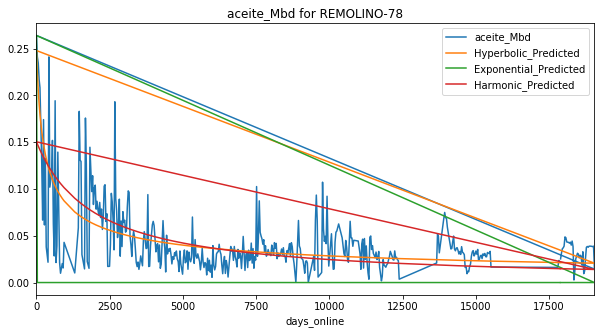

Exponential Fit Curve-fitted Variables: qi=0.1704900015737312, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.5474036682987012, b=0.1353309412938757, di=0.00327535701876306
Harmonic Fit Curve-fitted Variables: qi=0.5653779208242613, b=0.5653779208242613, di=0.0064871305856879675


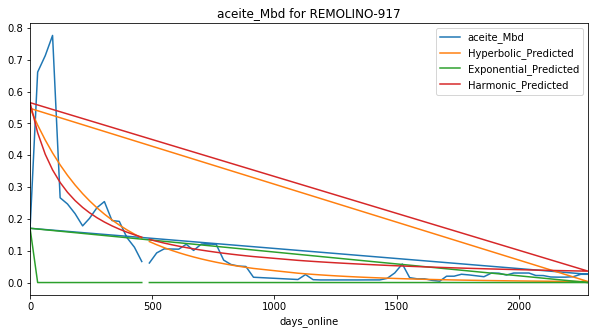

Exponential Fit Curve-fitted Variables: qi=0.08468000014404352, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.15615602407028714, b=0.5545791896485472, di=0.004110774293128334
Harmonic Fit Curve-fitted Variables: qi=0.16188911369534836, b=0.16188911369534836, di=0.0059315587146919965


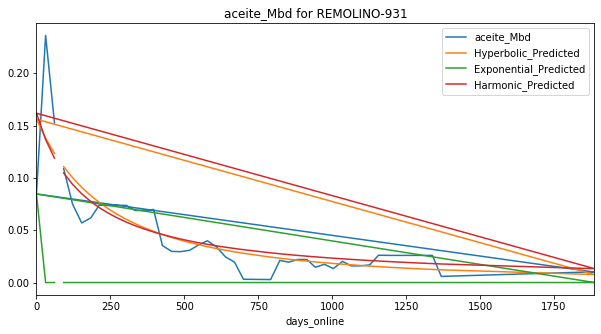

Exponential Fit Curve-fitted Variables: qi=0.005412748079103364, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0551262819791667, b=1.7201612082947753, di=0.003205466061401999
Harmonic Fit Curve-fitted Variables: qi=0.052961111945515664, b=0.052961111945515664, di=0.001979143353947676


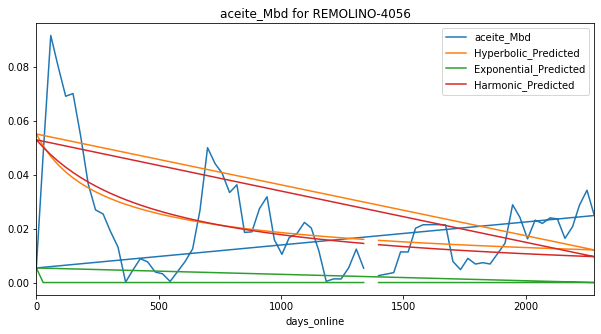

Exponential Fit Curve-fitted Variables: qi=0.0032095893782215805, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0072781708017436815, b=1.9999999999755411, di=2.4832532354689664e-15
Harmonic Fit Curve-fitted Variables: qi=0.007278158819714191, b=0.007278158819714191, di=3.207112508967612e-14


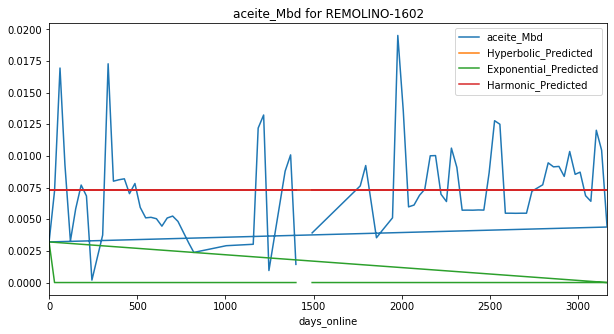

Exponential Fit Curve-fitted Variables: qi=0.03291708291941044, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.5443243740069116, b=0.2472462836327255, di=0.0017446836146731337
Harmonic Fit Curve-fitted Variables: qi=0.5618074179252914, b=0.5618074179252914, di=0.0029853719101231423


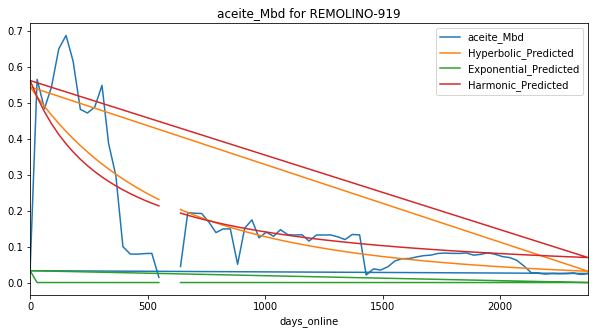

Exponential Fit Curve-fitted Variables: qi=0.13370192344955312, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.14317832034382738, b=0.15311515389828656, di=0.00017878006909255713
Harmonic Fit Curve-fitted Variables: qi=0.16103519839622957, b=0.16103519839622957, di=0.00036131557690057746


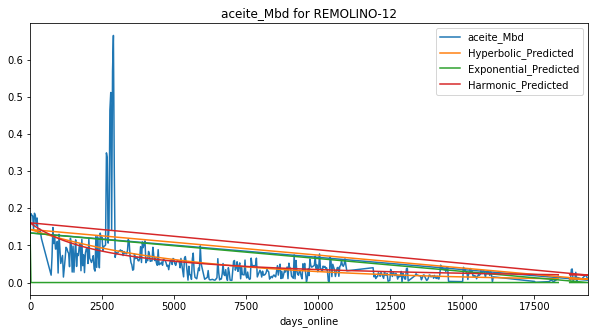

Exponential Fit Curve-fitted Variables: qi=0.02357706531780399, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.2836212906597696, b=5.70463334860487e-08, di=0.00723831565789167
Harmonic Fit Curve-fitted Variables: qi=0.24143663976642277, b=0.24143663976642277, di=0.011643449209210418


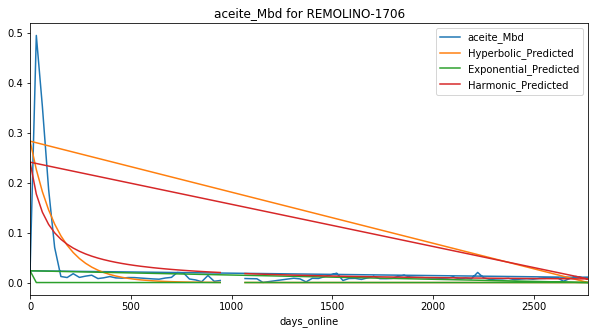

Exponential Fit Curve-fitted Variables: qi=0.010392123643877057, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.008489769094192927, b=4.027039090262474e-06, di=2.4373881902566183e-18
Harmonic Fit Curve-fitted Variables: qi=0.008489768859895153, b=0.008489768859895153, di=5.542241591406798e-14


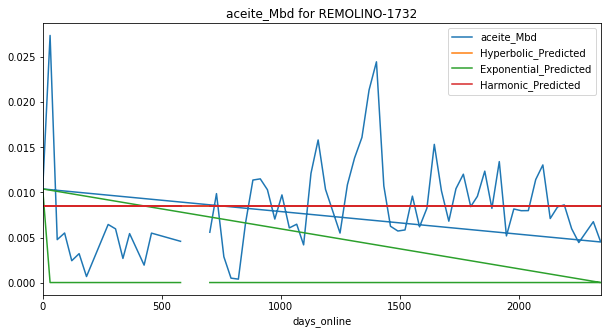

Exponential Fit Curve-fitted Variables: qi=0.09601414453125, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.09179999722005833, b=1.9999999999999998, di=0.05908649133110165
Harmonic Fit Curve-fitted Variables: qi=0.015626847011598582, b=0.015626847011598582, di=1.0695474055298508e-14


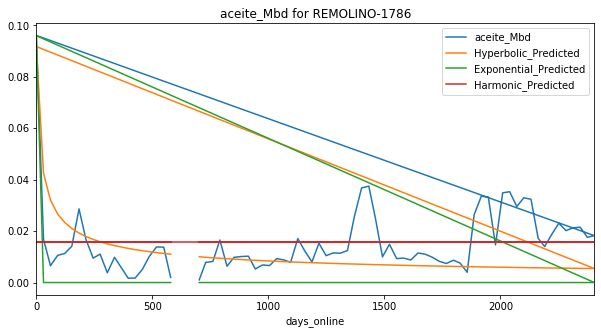

Exponential Fit Curve-fitted Variables: qi=0.0014470737306370432, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.014993958729538489, b=1.9999999999999998, di=0.00014893159070288563
Harmonic Fit Curve-fitted Variables: qi=0.014731123333619806, b=0.014731123333619806, di=0.00011088168119900645


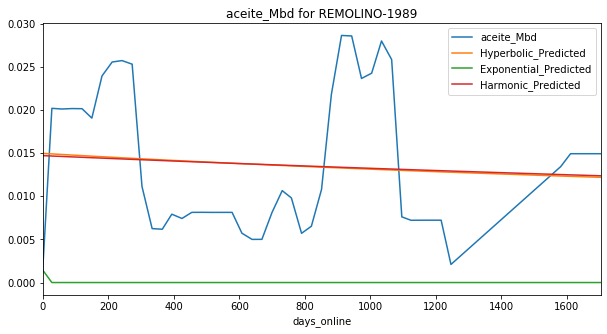

Exponential Fit Curve-fitted Variables: qi=0.06543004101562501, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.022623973722851503, b=1.9999999999999998, di=0.00035752367140309984
Harmonic Fit Curve-fitted Variables: qi=0.020922410351178932, b=0.020922410351178932, di=0.00019501988477875764


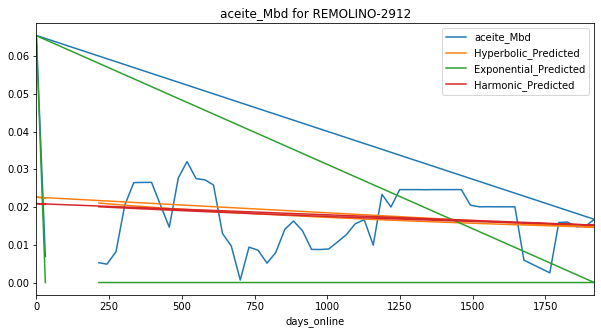

Exponential Fit Curve-fitted Variables: qi=0.08164618945312499, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.08172379498081009, b=1.9999999999999998, di=0.10367782130613785
Harmonic Fit Curve-fitted Variables: qi=0.07973547627467302, b=0.07973547627467302, di=0.03492309493678756


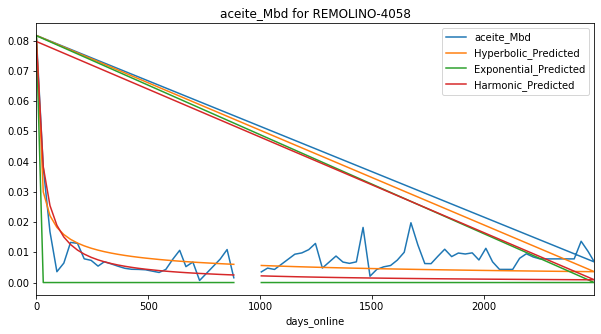

Exponential Fit Curve-fitted Variables: qi=0.15474399947900233, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.18229563489946254, b=0.8111279283641294, di=0.006626251834166829
Harmonic Fit Curve-fitted Variables: qi=0.1871295635834993, b=0.1871295635834993, di=0.008116130768143626


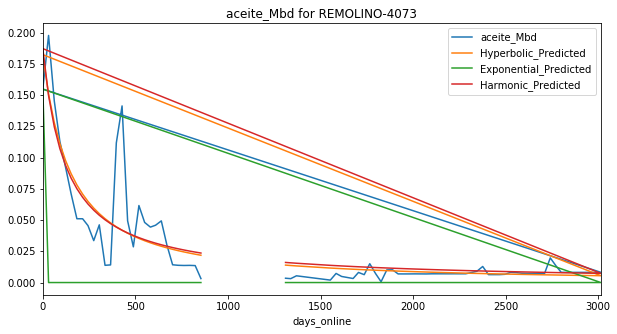

Exponential Fit Curve-fitted Variables: qi=0.203047999192826, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.3721601299256149, b=2.2441536854697835e-08, di=0.003967199340558623
Harmonic Fit Curve-fitted Variables: qi=0.367320228918146, b=0.367320228918146, di=0.008400362261164395


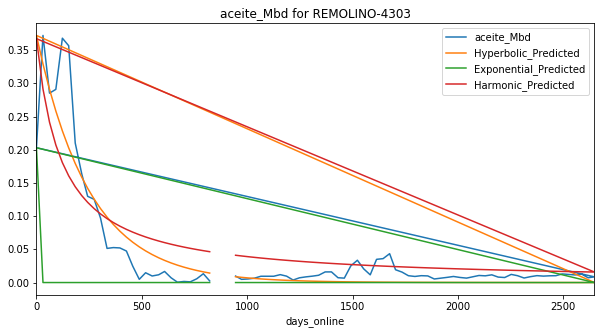

Exponential Fit Curve-fitted Variables: qi=0.9761184188232424, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.976177999999996, b=0.5745510107905362, di=0.008547550012277326
Harmonic Fit Curve-fitted Variables: qi=0.976178, b=0.976178, di=0.012187045947751829


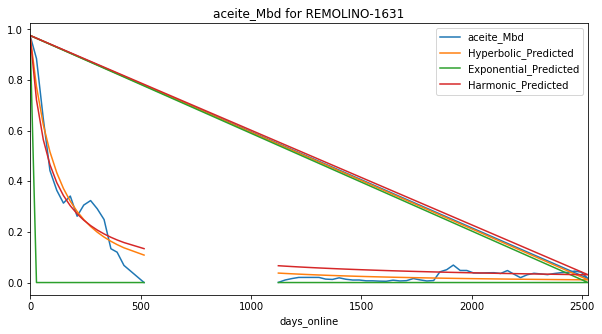

Exponential Fit Curve-fitted Variables: qi=0.08821277050781251, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.08829899999994731, b=1.9999999999999942, di=0.01566484252252487
Harmonic Fit Curve-fitted Variables: qi=0.08174157409131985, b=0.08174157409131985, di=0.005509311484221781


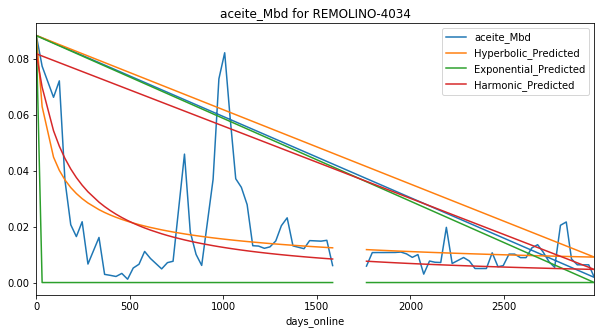

Exponential Fit Curve-fitted Variables: qi=0.00592208396956678, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.008660999931898254, b=1.999999999997666, di=2.9818544975356054e-11
Harmonic Fit Curve-fitted Variables: qi=0.008660946773967343, b=0.008660946773967343, di=6.0146926106370224e-09


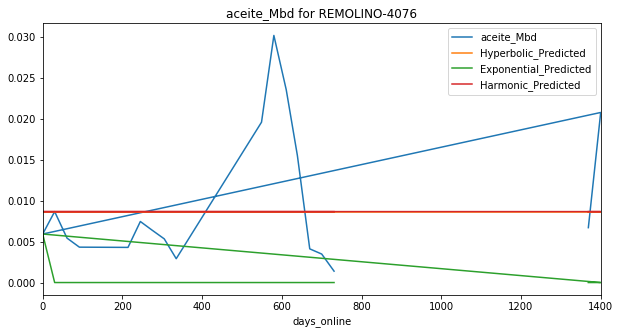

Exponential Fit Curve-fitted Variables: qi=0.06344100000236885, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1609361303450224, b=2.5557923479927443e-16, di=0.006102797253509526
Harmonic Fit Curve-fitted Variables: qi=0.15234342925292174, b=0.15234342925292174, di=0.010308702518042116


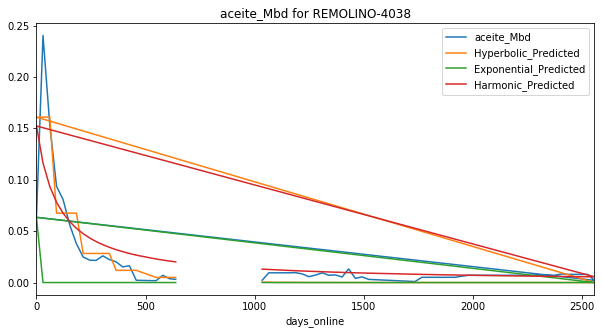

Exponential Fit Curve-fitted Variables: qi=0.28501596668722406, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.34662590160574286, b=3.905661431192468e-11, di=0.011637118076184658
Harmonic Fit Curve-fitted Variables: qi=0.33428018849913965, b=0.33428018849913965, di=0.022439311799649073


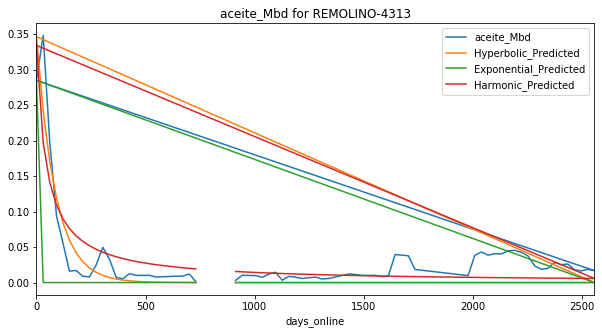

Exponential Fit Curve-fitted Variables: qi=0.21271905395507815, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.21252492921353502, b=1.9999999999999998, di=0.022462815870122898
Harmonic Fit Curve-fitted Variables: qi=0.1623406809217437, b=0.1623406809217437, di=0.005169634694346736


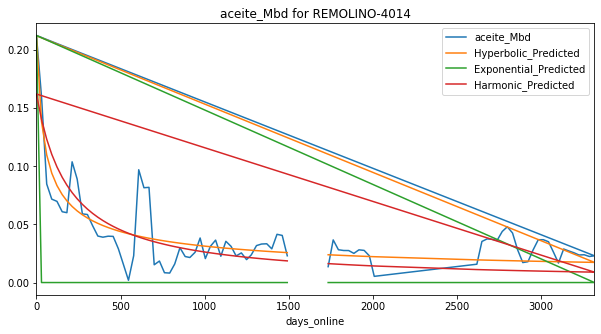

Exponential Fit Curve-fitted Variables: qi=0.023885075270797876, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.02596765675791205, b=1.3293460010840066e-14, di=5.454216901311134e-05
Harmonic Fit Curve-fitted Variables: qi=0.02554244058622208, b=0.02554244058622208, di=4.3676469312091915e-05


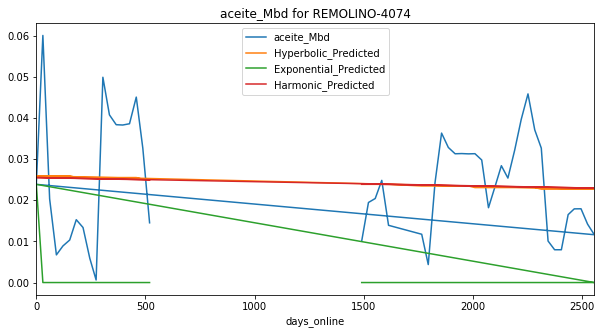

Exponential Fit Curve-fitted Variables: qi=0.03167295882722979, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.04284008476896061, b=1.5623618045352499e-06, di=1.0185640281511216e-05
Harmonic Fit Curve-fitted Variables: qi=0.04268494478408812, b=0.04268494478408812, di=9.697145573231736e-06


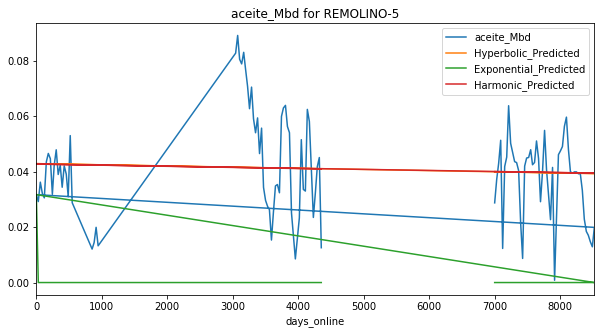

Exponential Fit Curve-fitted Variables: qi=1.385944403503418, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=1.3817635740626764, b=1.2064028356033187, di=0.0816004335606208
Harmonic Fit Curve-fitted Variables: qi=1.374874784696164, b=1.374874784696164, di=0.06177566407869924


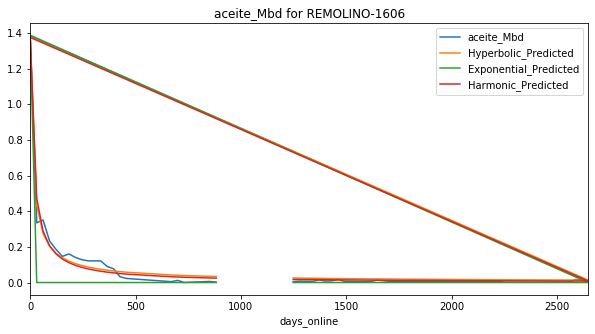

Exponential Fit Curve-fitted Variables: qi=0.00023256911638887466, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.003095999479731673, b=1.9999999997107356, di=2.904471337434658e-09
Harmonic Fit Curve-fitted Variables: qi=0.003095999986427804, b=0.003095999986427804, di=9.10032114484824e-12


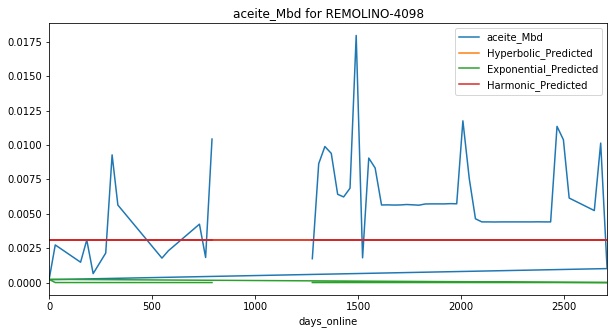

Exponential Fit Curve-fitted Variables: qi=0.14760899068997924, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.15546999999999997, b=1.0786633823821339, di=0.006401196238677189
Harmonic Fit Curve-fitted Variables: qi=0.15546999999999997, b=0.15546999999999997, di=0.006093634704049253


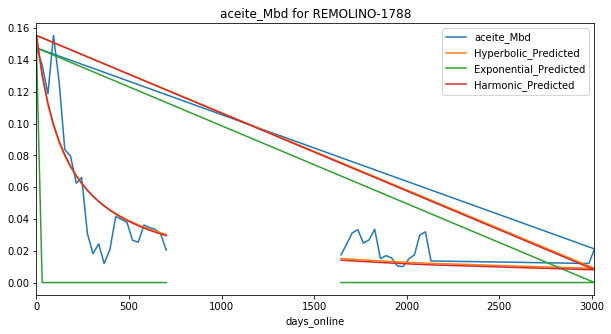

Exponential Fit Curve-fitted Variables: qi=0.08878421191406251, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.05242944486702745, b=1.3703905302178888e-07, di=5.034260020506493e-05
Harmonic Fit Curve-fitted Variables: qi=0.0531491080564723, b=0.0531491080564723, di=7.33982200214146e-05


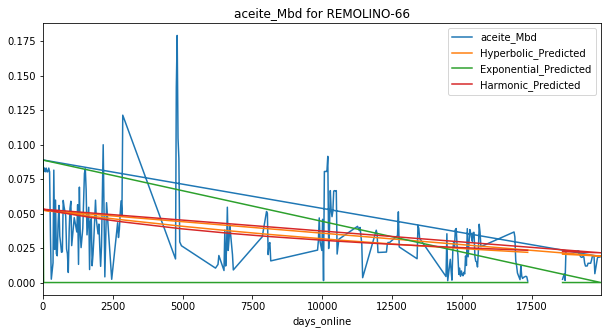

Exponential Fit Curve-fitted Variables: qi=0.02595012739447243, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.017692814155382774, b=2.2213524708547538e-07, di=7.818640548121664e-17
Harmonic Fit Curve-fitted Variables: qi=0.017692814105604287, b=0.017692814105604287, di=2.5762390053891715e-16


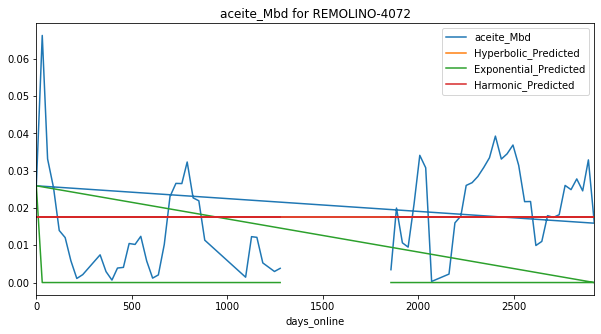

Exponential Fit Curve-fitted Variables: qi=0.049973205078125, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.027526133462755224, b=1.9999999999999998, di=0.0002828839878979998
Harmonic Fit Curve-fitted Variables: qi=0.026243399915580376, b=0.026243399915580376, di=0.00018525025408477005


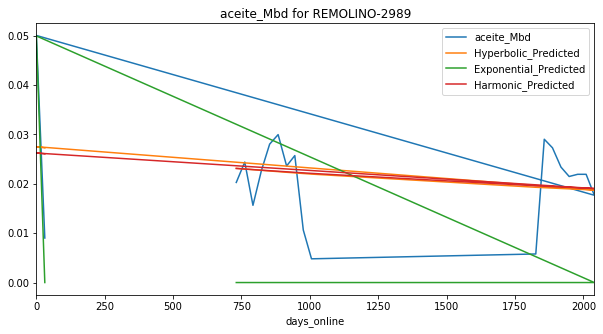

Exponential Fit Curve-fitted Variables: qi=0.05496200000252444, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.04423296111694215, b=1.9999999999999998, di=0.0003761296739837209
Harmonic Fit Curve-fitted Variables: qi=0.04082194093019873, b=0.04082194093019873, di=0.00020290989816259747


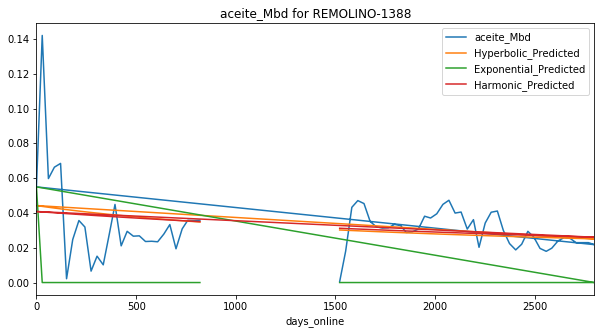

Exponential Fit Curve-fitted Variables: qi=0.039956806640625, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.023307853091678966, b=2.053816103614019e-11, di=0.0004125702465416829
Harmonic Fit Curve-fitted Variables: qi=0.023837397492981496, b=0.023837397492981496, di=0.000649038153282329


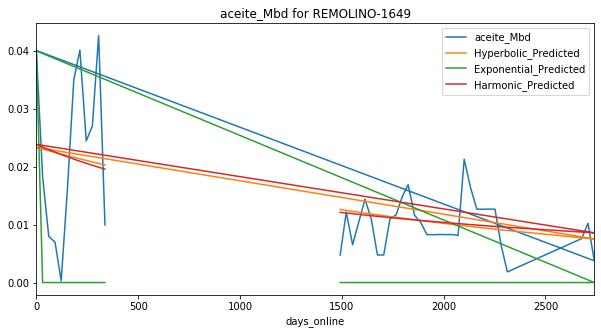

Exponential Fit Curve-fitted Variables: qi=0.042515798828125, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.022166295898323144, b=1.9999999999999998, di=1.6292762791809472e-15
Harmonic Fit Curve-fitted Variables: qi=0.022166279195464843, b=0.022166279195464843, di=6.357758998779673e-12


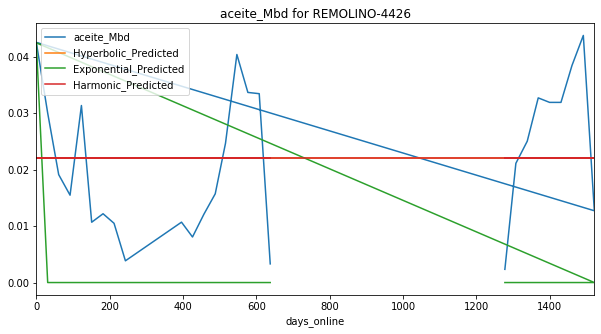

Exponential Fit Curve-fitted Variables: qi=0.121744525390625, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.11513277073655054, b=1.9999999999999998, di=0.015289452075953133
Harmonic Fit Curve-fitted Variables: qi=0.031214126726827694, b=0.031214126726827694, di=1.247206018142159e-05


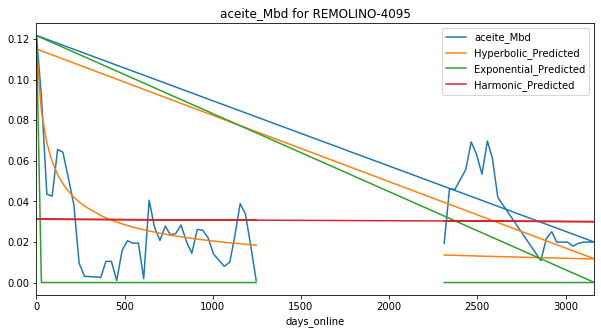

Exponential Fit Curve-fitted Variables: qi=0.02843900616662228, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0206335315676154, b=1.9999999999999998, di=3.0417218346937663e-15
Harmonic Fit Curve-fitted Variables: qi=0.020633530043281174, b=0.020633530043281174, di=4.4465247095618414e-14


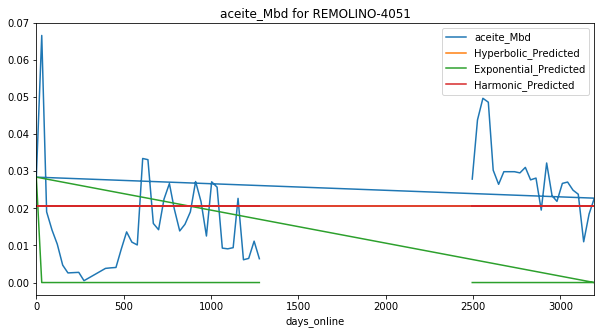

Exponential Fit Curve-fitted Variables: qi=0.013316897589798328, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.00821337833606556, b=1.9999999999999991, di=9.172448095813516e-12
Harmonic Fit Curve-fitted Variables: qi=0.008213401204457078, b=0.008213401204457078, di=5.104515119761137e-13


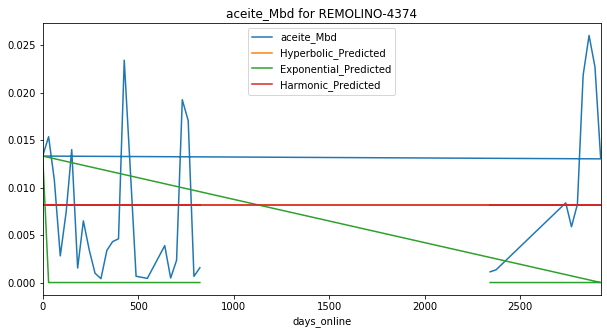

Exponential Fit Curve-fitted Variables: qi=0.03369100011323587, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.060052313247631654, b=1.9999999999999571, di=0.0065054556561848515
Harmonic Fit Curve-fitted Variables: qi=0.0560211118658246, b=0.0560211118658246, di=0.0035312822885055807


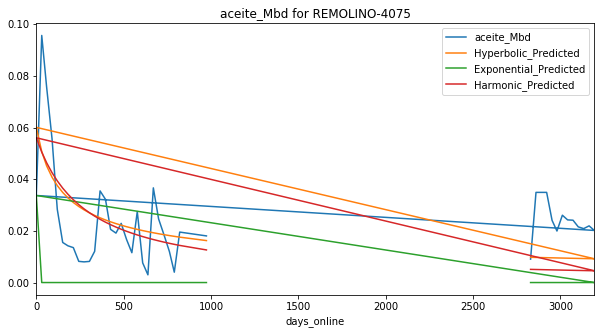

Exponential Fit Curve-fitted Variables: qi=0.009372023092827655, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0405665392745315, b=1.1349759188732038, di=0.0011199591102268457
Harmonic Fit Curve-fitted Variables: qi=0.04035952422308232, b=0.04035952422308232, di=0.0010294702095847916


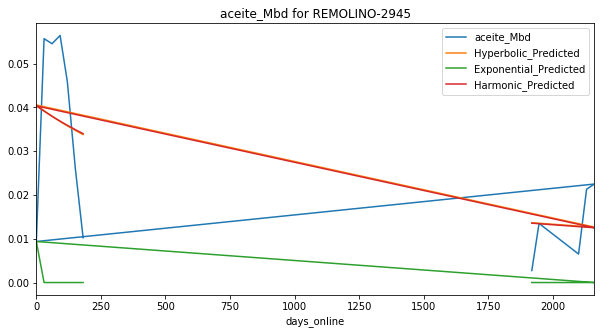

Exponential Fit Curve-fitted Variables: qi=0.1363993662109375, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.13563889601201776, b=1.9999999999999998, di=0.05820836702669726
Harmonic Fit Curve-fitted Variables: qi=0.1288957283210961, b=0.1288957283210961, di=0.023809009477006562


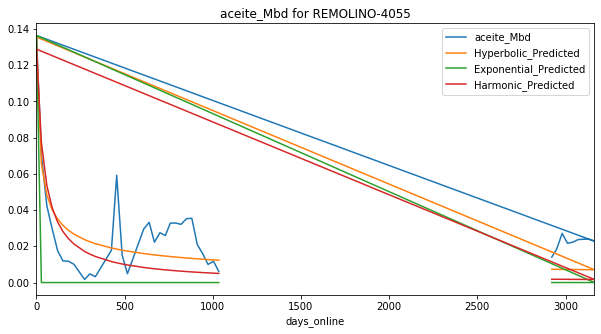

Exponential Fit Curve-fitted Variables: qi=0.045396830443596166, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0486239051855629, b=1.9999999999999942, di=0.011373363300171198
Harmonic Fit Curve-fitted Variables: qi=0.018079772807549074, b=0.018079772807549074, di=1.8017988040857302e-13


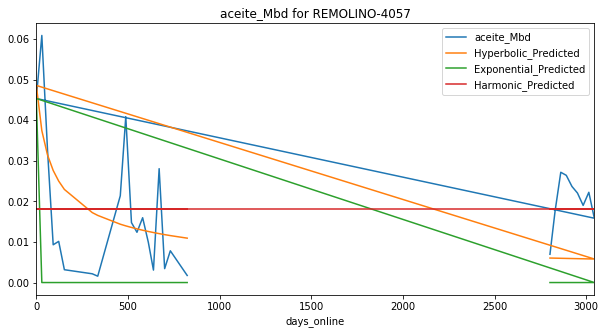

Exponential Fit Curve-fitted Variables: qi=0.021760883489442964, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.021168892881866148, b=2.2563621682181179e-07, di=1.035374877357242e-13
Harmonic Fit Curve-fitted Variables: qi=0.021168888629257514, b=0.021168888629257514, di=9.602896539583112e-13


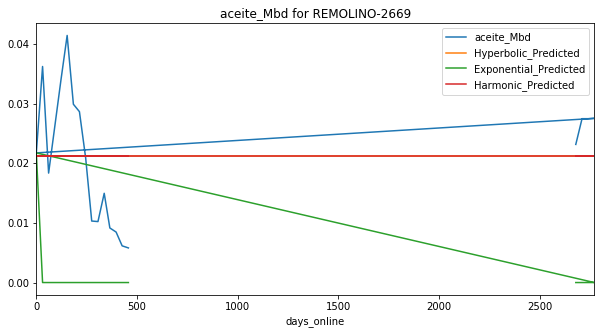

Exponential Fit Curve-fitted Variables: qi=0.011093052054376062, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.017854434569334512, b=6.743076691846368e-06, di=0.0022967135935533503
Harmonic Fit Curve-fitted Variables: qi=0.018037461450639142, b=0.018037461450639142, di=0.0029474893331187454


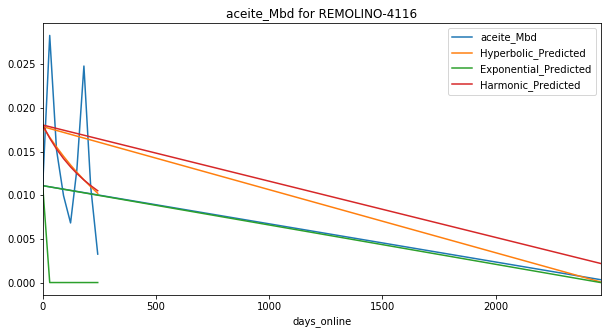

Exponential Fit Curve-fitted Variables: qi=0.008358253494455193, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.009502701327295872, b=2.447474285651035e-07, di=0.00214978270217575
Harmonic Fit Curve-fitted Variables: qi=0.009431455035590055, b=0.009431455035590055, di=0.0021174069237068554


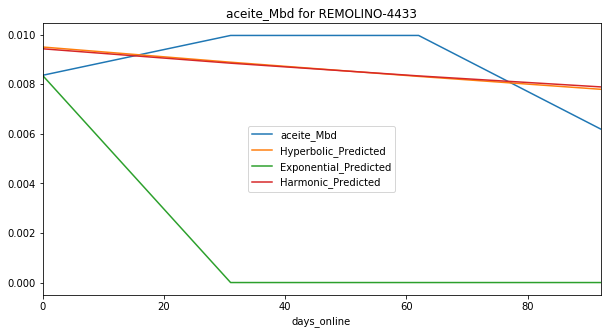

Exponential Fit Curve-fitted Variables: qi=0.07879580692584766, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.09240199999996845, b=0.5655053666417055, di=0.011336817990198703
Harmonic Fit Curve-fitted Variables: qi=0.09240199999999998, b=0.09240199999999998, di=0.015191243539717899


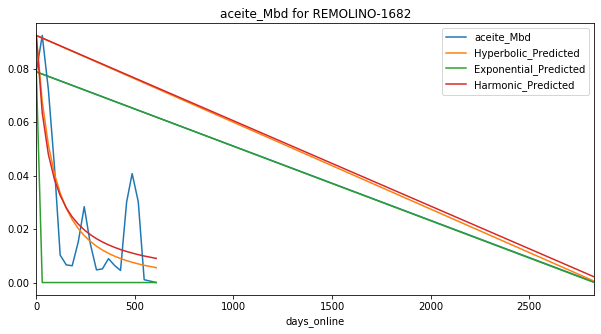

Exponential Fit Curve-fitted Variables: qi=0.0005751759841912283, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0073529029164058025, b=1.658799288727645, di=1.4288243189570523e-14
Harmonic Fit Curve-fitted Variables: qi=0.007352797596313893, b=0.007352797596313893, di=2.2229482511843675e-09


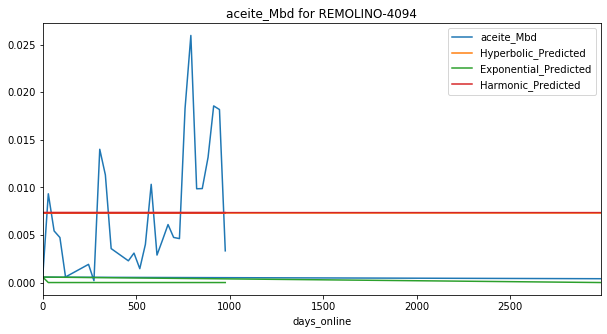

Exponential Fit Curve-fitted Variables: qi=0.06448196777343751, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.06222652054599378, b=1.9999999999999998, di=0.017589649765683234
Harmonic Fit Curve-fitted Variables: qi=0.03742939482824971, b=0.03742939482824971, di=0.0022672237629180734


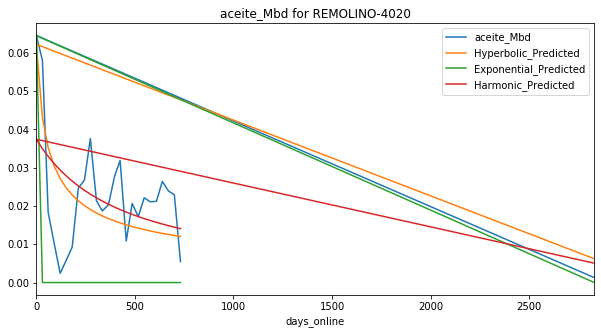

Exponential Fit Curve-fitted Variables: qi=0.03591300048385393, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.26030349325164825, b=1.9942227439156541, di=0.005092132857903891
Harmonic Fit Curve-fitted Variables: qi=0.23095058533268023, b=0.23095058533268023, di=0.001959199248658722


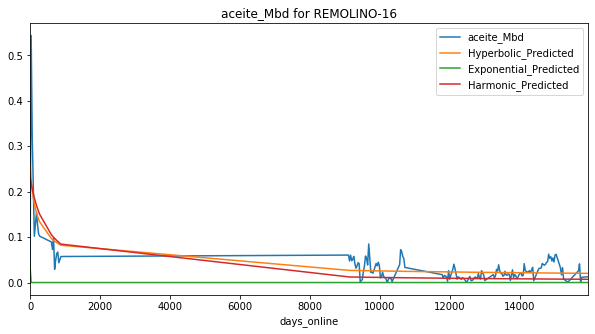

Exponential Fit Curve-fitted Variables: qi=0.008179065757972044, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.07170399999986377, b=1.2458736673158868e-09, di=6.963068597156099e-05
Harmonic Fit Curve-fitted Variables: qi=0.07170399999999998, b=0.07170399999999998, di=7.293755972025369e-05


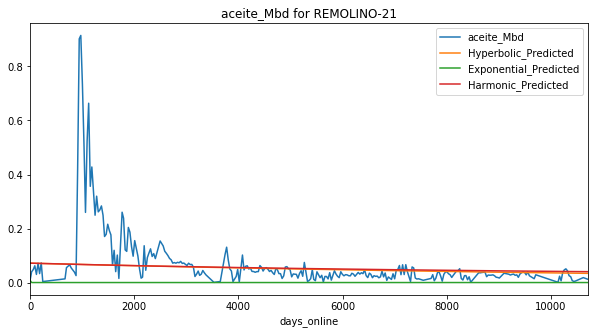

Exponential Fit Curve-fitted Variables: qi=0.09313000468178029, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.09512038571088344, b=1.999999997776147, di=9.643621061735388e-05
Harmonic Fit Curve-fitted Variables: qi=0.08707988473539575, b=0.08707988473539575, di=5.521128030695226e-05


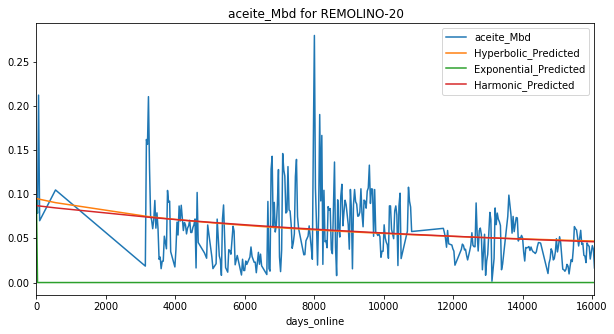

Exponential Fit Curve-fitted Variables: qi=0.029769594172456424, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0331259999999969, b=7.580758034800282e-14, di=2.19240147011496e-05
Harmonic Fit Curve-fitted Variables: qi=0.03312599999998822, b=0.03312599999998822, di=2.4277441965333737e-05


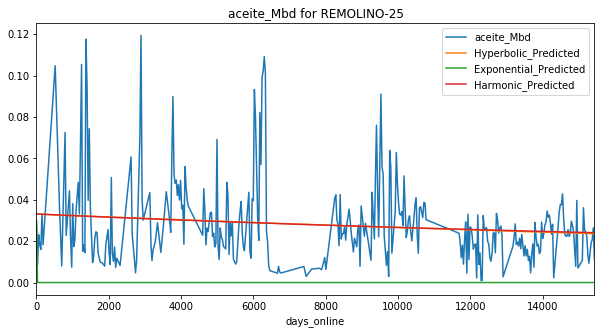

Exponential Fit Curve-fitted Variables: qi=0.013628007734120115, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.18387333983098522, b=1.6925407785802564, di=0.0019267905883889355
Harmonic Fit Curve-fitted Variables: qi=0.15397101244665198, b=0.15397101244665198, di=0.0007769292609425369


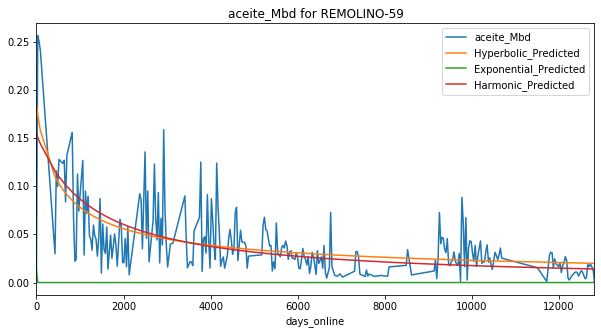

Exponential Fit Curve-fitted Variables: qi=0.10084593397807079, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.105215994096617, b=1.7310920389208953e-07, di=3.3763756173459286e-05
Harmonic Fit Curve-fitted Variables: qi=0.1052159999999998, b=0.1052159999999998, di=3.93371109509003e-05


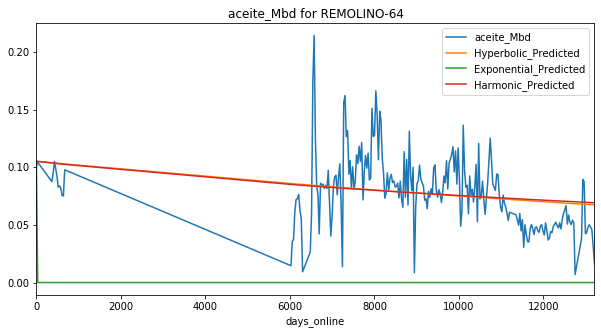

Exponential Fit Curve-fitted Variables: qi=0.00750700116523734, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03272051904692998, b=2.3848802686501487e-15, di=5.327392486964998e-06
Harmonic Fit Curve-fitted Variables: qi=0.03287998754586842, b=0.03287998754586842, di=5.849890603551979e-06


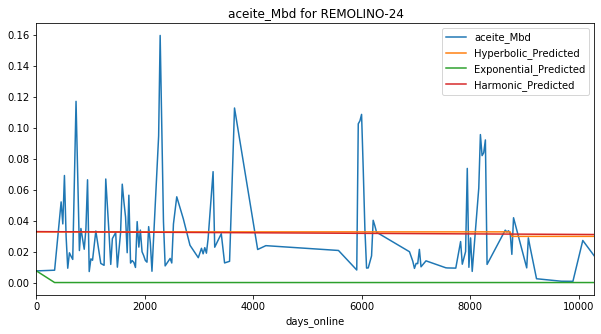

Exponential Fit Curve-fitted Variables: qi=0.07421999999923128, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.08787036465582115, b=0.682941447747668, di=0.00023830795582473806
Harmonic Fit Curve-fitted Variables: qi=0.09126015717564007, b=0.09126015717564007, di=0.00030241078311015


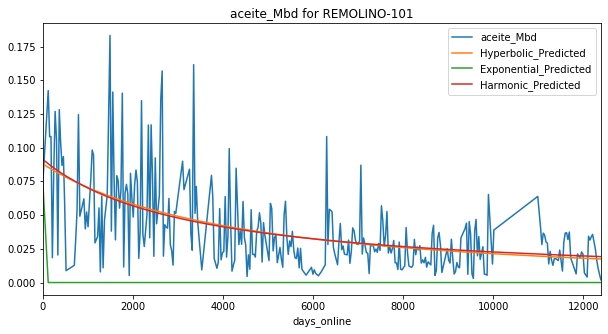

Exponential Fit Curve-fitted Variables: qi=0.031448991196973204, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.043618797629897454, b=2.6538900200698268e-12, di=5.099844894910757e-05
Harmonic Fit Curve-fitted Variables: qi=0.04401874483231481, b=0.04401874483231481, di=6.564607565192944e-05


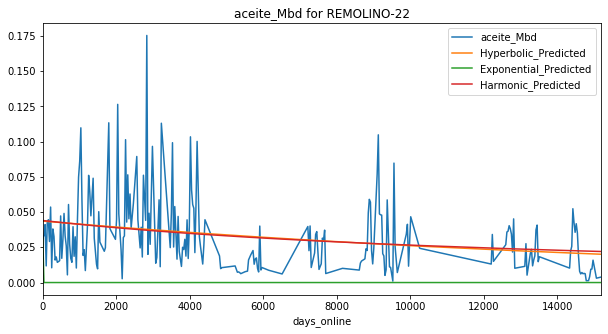

Exponential Fit Curve-fitted Variables: qi=0.11782899973294561, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.11044594411258306, b=1.9999999999999993, di=0.0017909976428978525
Harmonic Fit Curve-fitted Variables: qi=0.08195729222494778, b=0.08195729222494778, di=0.00044389388804101496


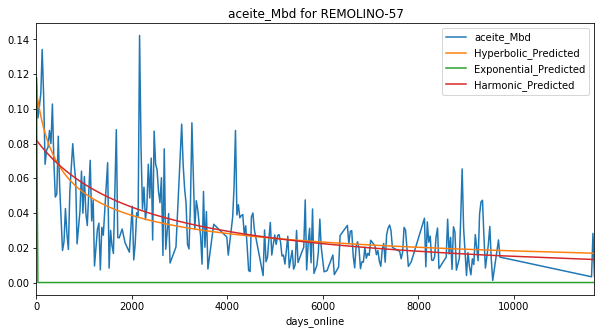

Exponential Fit Curve-fitted Variables: qi=0.08001958006364247, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.08086899999999982, b=7.120295411761868e-12, di=2.393717832709455e-05
Harmonic Fit Curve-fitted Variables: qi=0.080869, b=0.080869, di=2.16484550023486e-05


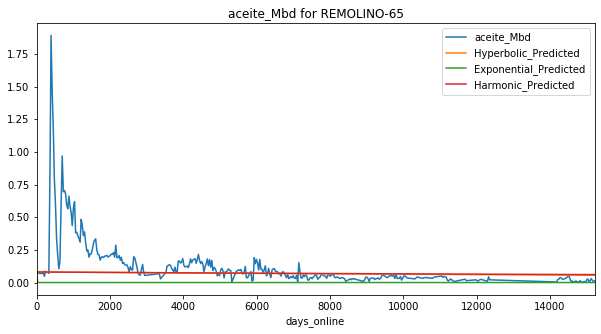

Exponential Fit Curve-fitted Variables: qi=0.17675265283203126, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.16041598825481804, b=1.9999999999999998, di=0.017586922176556594
Harmonic Fit Curve-fitted Variables: qi=0.056576929452495706, b=0.056576929452495706, di=0.00046498190259753756


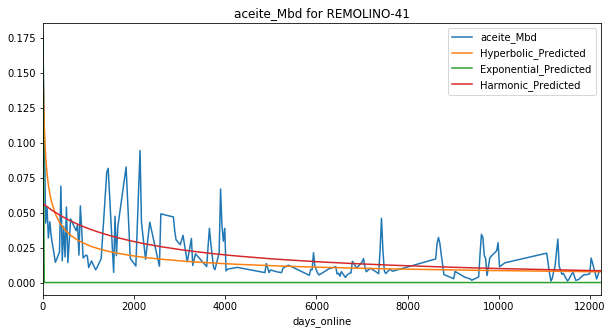

Exponential Fit Curve-fitted Variables: qi=0.044231000181803884, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.21719816813454743, b=1.9999999999999998, di=0.0011210550717745756
Harmonic Fit Curve-fitted Variables: qi=0.16215928267487237, b=0.16215928267487237, di=0.00030092365800465947


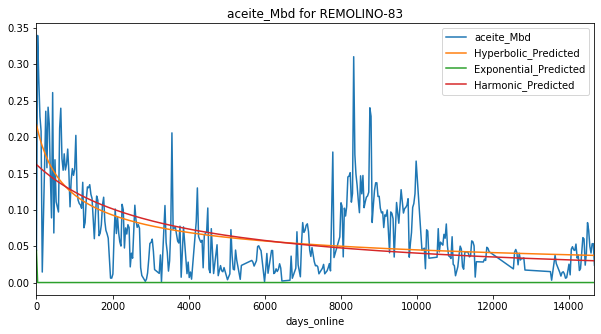

Exponential Fit Curve-fitted Variables: qi=0.34832493896484373, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.3033436505380471, b=1.5677179356680702, di=0.0031177456825616907
Harmonic Fit Curve-fitted Variables: qi=0.2569426870340975, b=0.2569426870340975, di=0.0013958835590672121


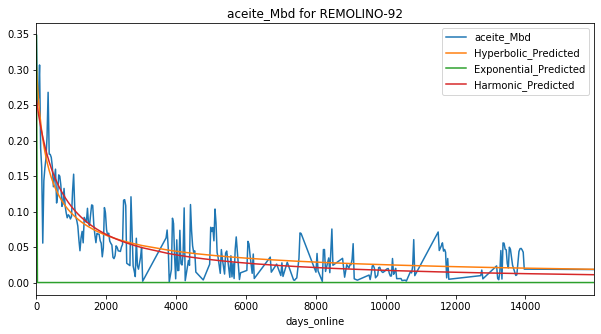

Exponential Fit Curve-fitted Variables: qi=0.07403099999744006, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.07517563810803282, b=1.9999999999929148, di=0.0008343033279092025
Harmonic Fit Curve-fitted Variables: qi=0.06381055971513094, b=0.06381055971513094, di=0.00032648118592214817


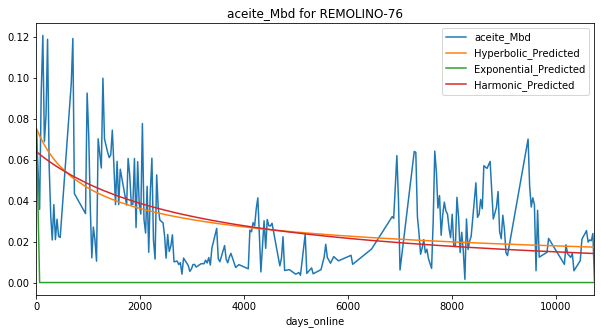

Exponential Fit Curve-fitted Variables: qi=0.1570158618378206, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.16409103815739431, b=1.1289345268747717, di=0.0007377309713679444
Harmonic Fit Curve-fitted Variables: qi=0.1607170809220963, b=0.1607170809220963, di=0.000650884096004115


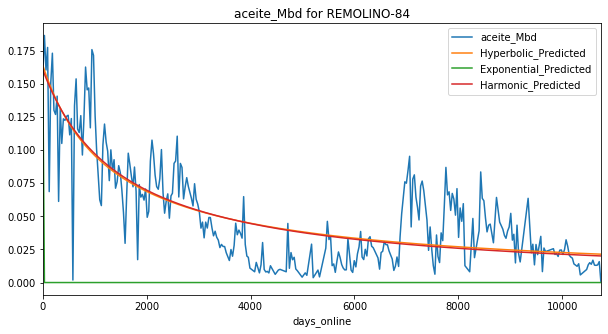

Exponential Fit Curve-fitted Variables: qi=0.0024357481073004135, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.015270381259267718, b=3.932764579947185e-08, di=0.0004027618482984143
Harmonic Fit Curve-fitted Variables: qi=0.014787678259857055, b=0.014787678259857055, di=0.00046381139784463723


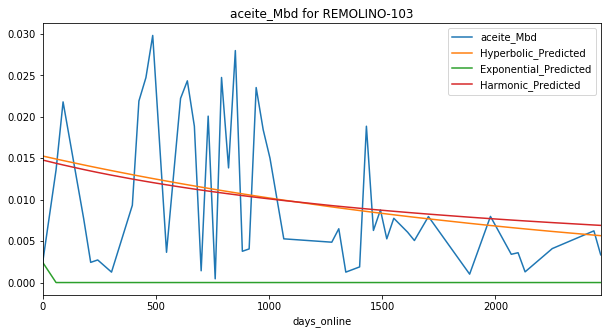

Exponential Fit Curve-fitted Variables: qi=0.0128040868149824, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.010357470878785212, b=0.18530606745420977, di=0.0007400504759375643
Harmonic Fit Curve-fitted Variables: qi=0.010714627425192389, b=0.010714627425192389, di=0.0012356994250692973


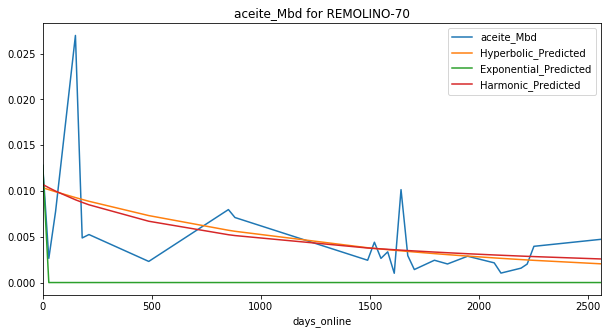

Exponential Fit Curve-fitted Variables: qi=0.007303908436993268, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.007058898576339026, b=3.8503494219764586e-11, di=0.0001852421461432979
Harmonic Fit Curve-fitted Variables: qi=0.006951170599506309, b=0.006951170599506309, di=0.00020034803741563915


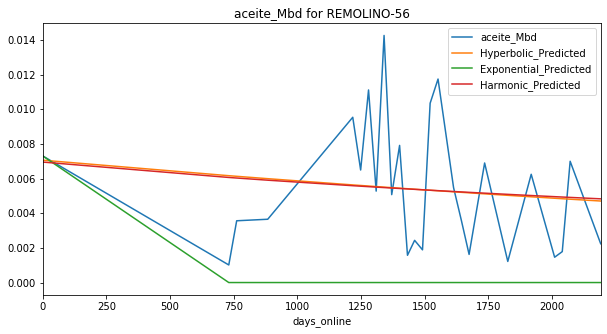

Exponential Fit Curve-fitted Variables: qi=0.009192525426890079, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.010878744945662594, b=6.026072191485371e-11, di=0.00018178972180247626
Harmonic Fit Curve-fitted Variables: qi=0.010816834563260698, b=0.010816834563260698, di=0.0001667721018730777


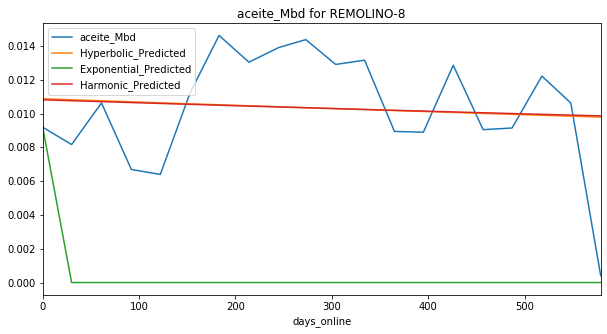

/opt/anaconda3/lib/python3.7/site-packages/scipy/optimize/minpack.py:795: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)
/opt/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)


Exponential Fit Curve-fitted Variables: qi=0.0023773125, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0023773125, b=1.0, di=5.0
Harmonic Fit Curve-fitted Variables: qi=0.0023773125, b=0.0023773125, di=5.0


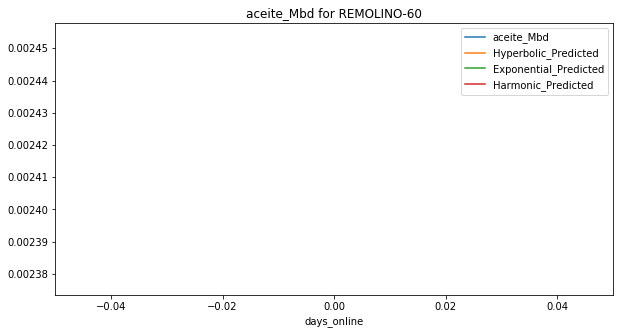

Exponential Fit Curve-fitted Variables: qi=0.01969775390625, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.01969775390625, b=1.0, di=5.0
Harmonic Fit Curve-fitted Variables: qi=0.01969775390625, b=0.01969775390625, di=5.0


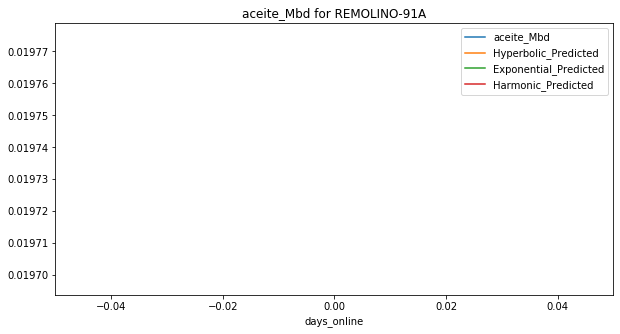

Exponential Fit Curve-fitted Variables: qi=0.09631485058593751, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.05779832293581129, b=1.9999999999999998, di=0.000998815811331993
Harmonic Fit Curve-fitted Variables: qi=0.05027058649299783, b=0.05027058649299783, di=0.00038506525143969966


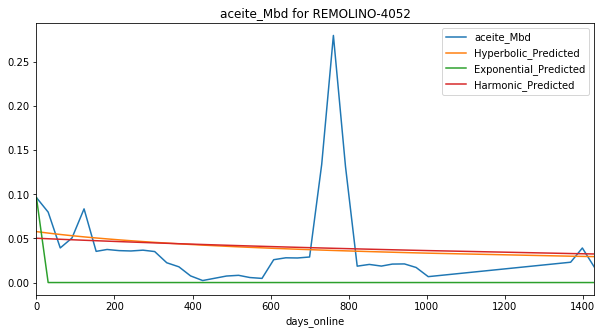

Exponential Fit Curve-fitted Variables: qi=0.0016981549674369076, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.013462999976350105, b=0.008798762921861103, di=3.1467354888533525e-10
Harmonic Fit Curve-fitted Variables: qi=0.013462994507262143, b=0.013462994507262143, di=8.544528373450642e-09


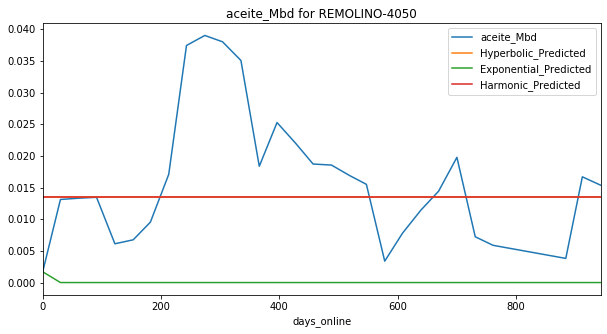

Exponential Fit Curve-fitted Variables: qi=0.05722406249999999, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.04928241783974671, b=1.9999999999999998, di=0.00660252801503768
Harmonic Fit Curve-fitted Variables: qi=0.03868271911787738, b=0.03868271911787738, di=0.0020226353663826335


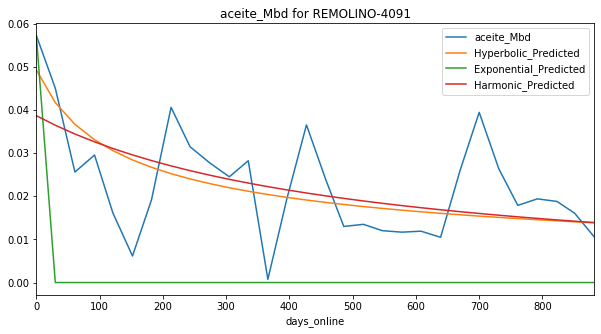

Exponential Fit Curve-fitted Variables: qi=0.045011914062500005, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.043989195587643824, b=1.9999999999999998, di=0.0494378505590058
Harmonic Fit Curve-fitted Variables: qi=0.04014070314155077, b=0.04014070314155077, di=0.019921345936210314


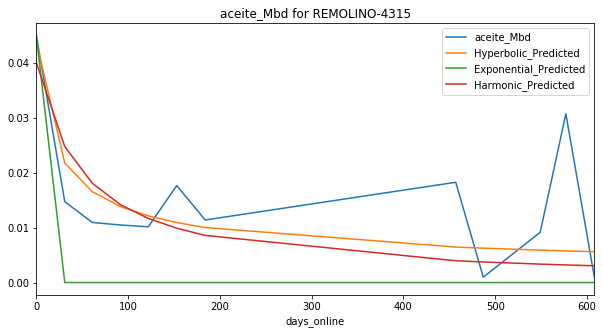

Exponential Fit Curve-fitted Variables: qi=0.010190001254858503, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.020146049359407524, b=3.565485695020739e-07, di=0.0035228311169363
Harmonic Fit Curve-fitted Variables: qi=0.019476647245025208, b=0.019476647245025208, di=0.003520892235340314


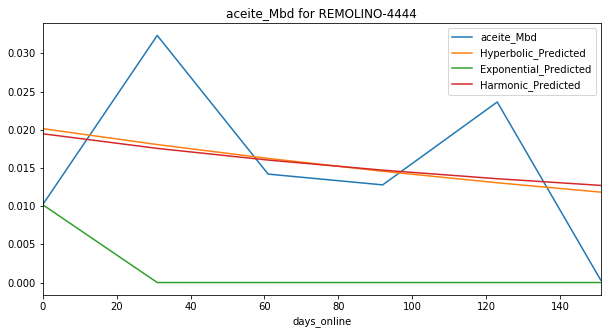

Exponential Fit Curve-fitted Variables: qi=0.012052999836022333, di=5.0
Hyperbolic Fit Curve-fitted Variables: qi=0.018388641685804456, b=0.0009083935005501111, di=0.0016507112217901809
Harmonic Fit Curve-fitted Variables: qi=0.01806705083212974, b=0.01806705083212974, di=0.0015763539510834357


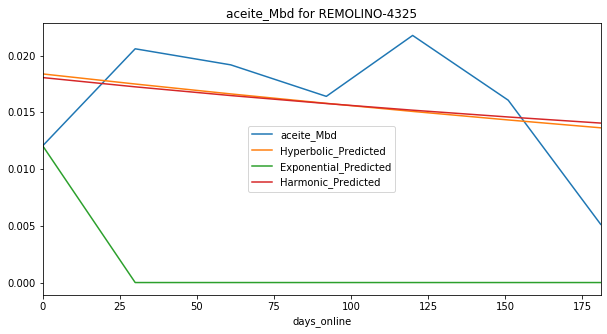

71.82712586000025

In [56]:
import timeit
tic=timeit.default_timer()

def read_in_csv(file_path):
    """
    Read in the specified csv as a pandas dataframe
    Arguments: 
        file_path: String. Path for the csv file that we want to read in
    Outputs:
        dataframe: Pandas dataframe.
    """
    well_data=pd.read_csv(file_path,parse_dates=True)
    return well_data

def remove_nan_and_zeroes_from_columns(df, variable):
    """
    This function cleans up a dataframe by removing rows in a specific 
    column that are null/NaN or equal to 0. This basically removes zero 
    production time periods.
    Arguments:
        df: Pandas dataframe.
        variable: String. Name of the column where we want to filter out
        NaN's or 0 values
    Output:
        filtered_df: Pandas dataframe. Dataframe with NaN's and zeroes filtered out of 
        the specified column
    """
    filtered_df = df[(df[variable].notnull()) & (df[variable]>0)]
    return filtered_df

def generate_time_delta_column(df, time_column, date_first_online_column):
    """
    Create column for the time that a well has been online at each reading, with 
    the first non-null month in the series listed as the start of production
    Arguments:
        df: Pandas dataframe
        time_column: String. Name of the column that includes the specific record date
        that the data was taken at. Column type is pandas datetime
        date_first_online_column: Name of the column that includes the date that the
        well came online. Column type is pandas datetime
    Outputs:
        Pandas series containing the difference in days between the date the well
        came online and the date that the data was recorded (cumulative days online)
    """
    df['Dias Produciendo']=(df[time_column]-df[date_first_online_column]).dt.days
    return (df[time_column]-df[date_first_online_column]).dt.days

def get_min_or_max_value_in_column_by_group(dataframe, group_by_column, calc_column, calc_type):
    global value
    """
    This function obtains the min or max value for a column, with a group by applied. For example,
    it could return the earliest (min) RecordDate for each API number in a dataframe 
    Arguments:
        dataframe: Pandas dataframe 
        group_by_column: string. Name of column that we want to apply a group by to
        calc_column: string. Name of the column that we want to get the aggregated max or min for
        calc_type: string; can be either 'min' or 'max'. Defined if we want to pull the min value 
        or the max value for the aggregated column
    Outputs:
        value: Depends on the calc_column type.
    """
    value=dataframe.groupby(group_by_column)[calc_column].transform(calc_type)
    return value

def get_max_initial_production(df, number_first_months, variable_column, date_column):
    global df_beginning_production
    """
    This function allows you to look at the first X months of production, and selects 
    the highest production month as max initial production
    Arguments:
        df: Pandas dataframe. 
        number_first_months: float. Number of months from the point the well comes online
        to compare to get the max initial production rate qi (this looks at multiple months
        in case there is a production ramp-up)
        variable_column: String. Column name for the column where we're attempting to get
        the max volume from (can be either 'Gas' or 'Oil' in this script)
        date_column: String. Column name for the date that the data was taken at 
    """
    #First, sort the data frame from earliest to most recent prod date
    df=df.sort_values(by=date_column)
    #Pull out the first x months of production, where number_first_months is x
    df_beginning_production=df.head(number_first_months)
    #Return the max value in the selected variable column from the newly created 
    #df_beginning_production df
    return df_beginning_production[variable_column].max()

def hyperbolic_equation(t, qi, b, di):
    """
    Hyperbolic decline curve equation
    Arguments:
        t: Float. Time since the well first came online, can be in various units 
        (days, months, etc) so long as they are consistent.
        qi: Float. Initial production rate when well first came online.
        b: Float. Hyperbolic decline constant
        di: Float. Nominal decline rate at time t=0
    Output: 
        Returns q, or the expected production rate at time t. Float.
    """
    return qi/((1.0+b*di*t)**(1.0/b))

def exponential_equation(t, qi, di):
    """
    Exponential decline curve equation
    Arguments:
        t: Float. Time since the well first came online, can be in various units 
        (days, months, etc) so long as they are consistent.
        qi: Float. Initial production rate when well first came online.
        di: Float. Nominal decline rate (constant)
    Output: 
        Returns q, or the expected production rate at time t. Float.
    """
    return qi*np.exp(-di*t)

def harmonic_equation (t, qi, di):
    """
    Harmonic decline curve equation
    Arguments:
        t: Float. Time since the well first came online, can be in various units 
        (days, months, etc) so long as they are consistent.
        qi: Float. Initial production rate when well first came online.
        di: Float. Nominal decline rate (constant)
    Output: 
        Returns q, or the expected production rate at time t. Float.
    """
    return qi/(1+(di*t))

def plot_actual_vs_predicted_by_equations(df, x_variable, y_variables, plot_title):
    """
    This function is used to map x- and y-variables against each other
    Arguments:
        df: Pandas dataframe.
        x_variable: String. Name of the column that we want to set as the 
        x-variable in the plot
        y_variables: string (single), or list of strings (multiple). Name(s) 
        of the column(s) that we want to set as the y-variable in the plot
    """
    #Plot results
    df.plot(x=x_variable, y=y_variables, title=plot_title,figsize=(10,5))
    plt.show()

def main(file_path):
    global well_data
    global production_time_series
    global results
    results=pd.DataFrame()
    #Read in the monthly oil and gas data
    #file_path=r'/Users/fffte/Documents/GitHub/Ainda/Proyecto Newton/02_productividad/kumaza_produccion.csv'
    well_data=read_in_csv(file_path)
    #Perform some data cleaning to get the columns as the right data type
    well_data['fecha']=pd.to_datetime(well_data['fecha'])
    #Declare the desired product that we want to curve fit for--it can either by 'Gas' or 'Oil'
    hydrocarbon='aceite_Mbd'
    #Remove all rows with null values in the desired time series column
    well_data=remove_nan_and_zeroes_from_columns(well_data, hydrocarbon)
    #Get a list of unique wells to loop through
    unique_well_list=pd.unique(list(well_data.pozo))
    #Get the earliest RecordDate for each Well
    well_data['days_online']= get_min_or_max_value_in_column_by_group(well_data, group_by_column='pozo', 
                  calc_column='fecha', calc_type='min')
    #Generate column for time online delta
    well_data['days_online']=generate_time_delta_column(well_data, time_column='fecha', 
                  date_first_online_column='days_online')
    #Pull data that came online between an specified range
    well_data_range=well_data[(well_data.fecha>='1900-01-01') & (well_data.fecha<='2019-12-01')]
    #Loop through each well, and perform calculations
    for pozo in unique_well_list:
        #Subset the dataframe by Well
        production_time_series=well_data_range[well_data_range.pozo==pozo]
        #Get the highest value of production in the first X months of production, to use as qi value
        qi=get_max_initial_production(production_time_series, 6, hydrocarbon, 'fecha')
        #Exponential curve fit the data to get best fit equation
        popt_exp, pcov_exp=curve_fit(exponential_equation, production_time_series['days_online'], 
                                     production_time_series[hydrocarbon],bounds=(0, [qi,10]))
        print('Exponential Fit Curve-fitted Variables: qi='+str(popt_exp[0])+', di='+str(popt_exp[1]))
        #Hyperbolic curve fit the data to get best fit equation
        popt_hyp, pcov_hyp=curve_fit(hyperbolic_equation, production_time_series['days_online'], 
                                     production_time_series[hydrocarbon],bounds=(0, [qi,2,10]))
        print('Hyperbolic Fit Curve-fitted Variables: qi='+str(popt_hyp[0])+', b='+str(popt_hyp[1])+', di='+str(popt_hyp[2]))
        #Harmonic curve fit the data to get best fit equation
        popt_harm, pcov_harm=curve_fit(harmonic_equation, production_time_series['days_online'], 
                                     production_time_series[hydrocarbon],bounds=(0, [qi,10]))
        print('Harmonic Fit Curve-fitted Variables: qi='+str(popt_harm[0])+', b='+str(popt_harm[0])+', di='+str(popt_harm[1]))
        #Exponential fit results
        production_time_series.loc[:,'Exponential_Predicted']=exponential_equation(production_time_series['days_online'], 
                                  *popt_exp)
        #Hyperbolic fit results
        production_time_series.loc[:,'Hyperbolic_Predicted']=hyperbolic_equation(production_time_series['days_online'], 
                                  *popt_hyp)
        #Harmonic fit results
        production_time_series.loc[:,'Harmonic_Predicted']=harmonic_equation(production_time_series['days_online'], 
                                  *popt_harm)
        
        results=results.append(production_time_series)
        #Declare the x- and y- variables that we want to plot against each other
        y_variables=[hydrocarbon, "Hyperbolic_Predicted", "Exponential_Predicted","Harmonic_Predicted"]
        x_variable='days_online'
        #Create the plot title
        plot_title=hydrocarbon+' for '+str(pozo)
        #Plot the data to visualize the equation fit
        plot_actual_vs_predicted_by_equations(production_time_series, x_variable, y_variables, plot_title)
                
if __name__== "__main__":
    main(r'/Users/fffte/ainda_drive/python/csv/benchmark/COAPECHACA.csv')

toc=timeit.default_timer()
toc - tic #elapsed time in seconds